<a href="https://colab.research.google.com/github/daniela12p/Tareas/blob/main/Parciales/Tercer_Parcial_SyS_2023.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

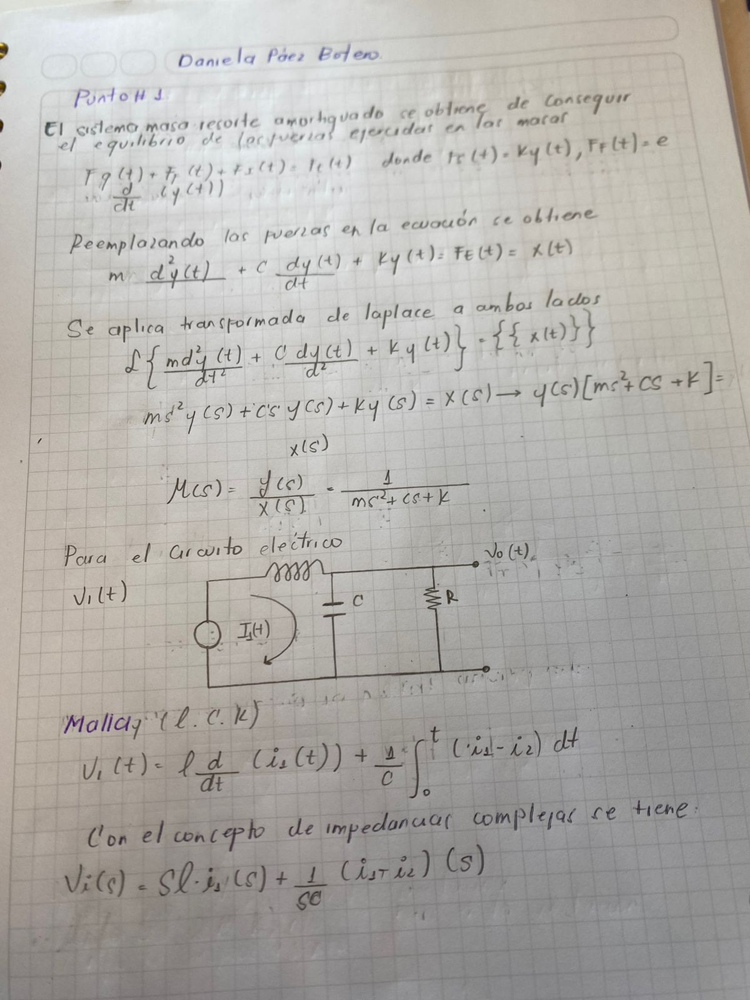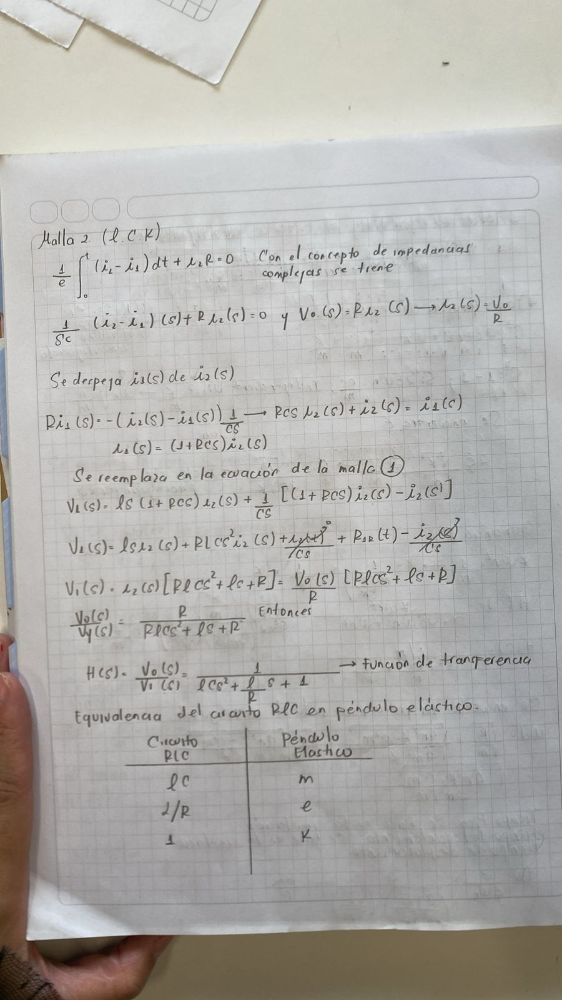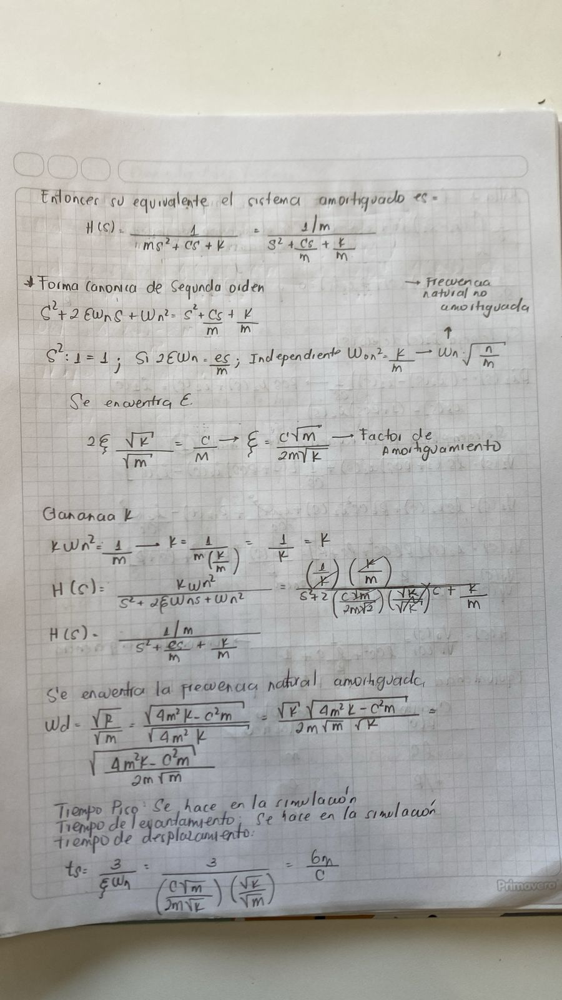

#**Punto 1**

In [1]:
!pip install sympy --upgrade #actualizar sympy para usar módulo de control

In [2]:
pip install control

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.1/455.1 kB 5.2 MB/s eta 0:00:00


In [3]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import sympy as sym
sym.init_printing()
#definiri variables
t, m, c, k = sym.symbols('t m c k', real=True,positive=True)
s = sym.symbols('s', complex=True)

Teniendo en cuenta la forma canónica:

$$H(s)=\frac{1}{a_2s^2+a_1s+a_0}$$

$$H(s)=K\frac{\omega_n^2}{s^2+2\xi \omega_ns+\omega_n^2}$$

In [4]:
#forma canónica del slit
a2 = m #CL en circuito equivalente
a1 = c #L/R en circuito equivalente
ao = k # 1 en circuito equivalente

Ko = 1/ao #ganancia circuito forma canónica
wn = sym.sqrt(ao/a2)
xi = a1/(2*a2*sym.sqrt(ao/a2))
#función de transferencia
H = Ko*wn**2/(s**2+2*xi*wn*s+wn**2)
H

       1        
────────────────
  ⎛c⋅s   k    2⎞
m⋅⎜─── + ─ + s ⎟
  ⎝ m    m     ⎠

In [5]:
#calcular polos
p1 = -xi*wn + 1j*wn*sym.sqrt(1-xi**2)
p2 = -xi*wn - 1j*wn*sym.sqrt(1-xi**2)
p1

                      _____________
                     ╱      2      
                    ╱      c       
        1.0⋅ⅈ⋅√k⋅  ╱   - ───── + 1 
   c             ╲╱      4⋅k⋅m     
- ─── + ───────────────────────────
  2⋅m                √m            

Ahora, para sistema subamortiguado:

$$0<\xi<1$$

$$0<\frac{a_1}{2 a_2 \sqrt{\frac {a_0} {a_2}}}<1$$

$$0<\frac{c}{2 m\sqrt{\frac {k} {m}}}<1$$

Asumimos:

$$c=1 = \frac{L}{R}$$

$L = 1$, $R=1$

$$k=1$$

$$m=4 = CL$$

$C=4$

$$\xi = \frac{1}{4}=0.25$$

In [6]:
#Reemplazando los valores
mck = {m: 4.0, c: 1.0, k: 1.0}
mck

{c: 1.0, k: 1.0, m: 4.0}

In [7]:
## Polos y ceros
print('p1=',p1.subs(mck))
print('p2=',p2.subs(mck))
print('xi=',xi.subs(mck))
print('omega_n=',wn.subs(mck))

p1= -0.125 + 0.484122918275927*I
p2= -0.125 - 0.484122918275927*I
xi= 0.250000000000000
omega_n= 0.500000000000000


#**Tiempo de establecimiento**

In [8]:
t_s = 6*m / c
print('El tiempo de establecimiento es de: ',t_s.subs(mck))

El tiempo de establecimiento es de:  24.0000000000000


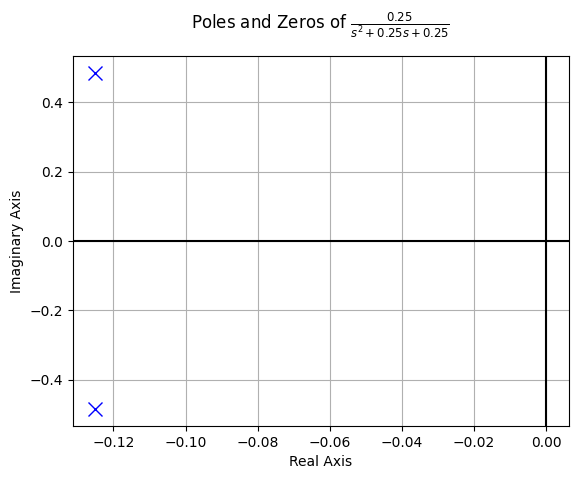

In [9]:
#gráfica polos y ceros paquete de control de sympy
from sympy.physics.control.lti import TransferFunction
from sympy.physics.control.control_plots import pole_zero_plot, bode_plot, impulse_response_plot, step_response_plot, ramp_response_plot
import control as ctrl
num,den=sym.fraction(H.subs(mck))

tf1 = TransferFunction(num, den, s)#numerados y denomirador función de transferencia con valores evaluados de RLC
pole_zero_plot(tf1)

#**Diagrama de bode**

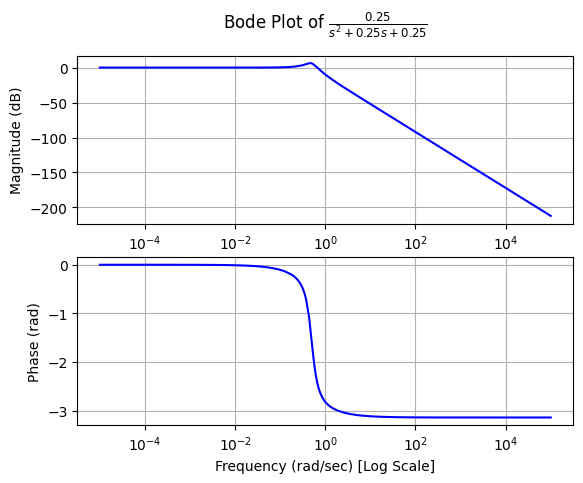

In [10]:
bode_plot(tf1)

#**Respuesta impulso**

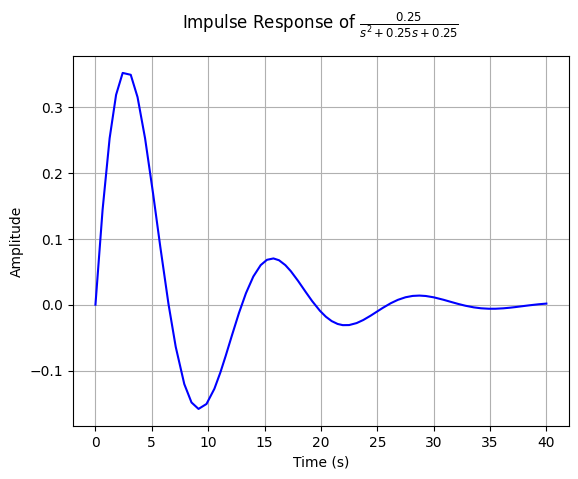

In [11]:
impulse_response_plot(tf1,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

#**Tiempo pico**

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import impulse, find_peaks

# Suponiendo que tf1 es tu función de transferencia
# (asegúrate de tener importada la función transfer_function)

# Definir la función de transferencia (sustituye tf1 con tu función)
numerator = [1]
denominator = [4, 1, 1]  # Sistema de segundo orden, por ejemplo

# Obtener la respuesta al impulso
time, response = impulse((numerator, denominator))

# Encontrar los picos en la respuesta al impulso
peaks, _ = find_peaks(response)

# Encontrar el tiempo correspondiente al primer pico
Tp = time[peaks[0]]
Tp

2.8282828282828287

#**Respuesta al escalón**

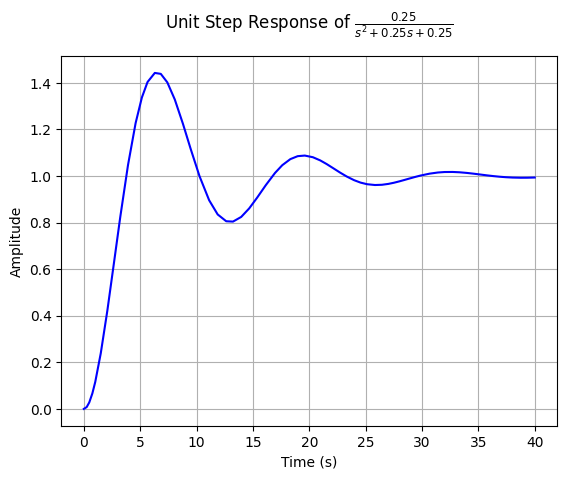

In [13]:
step_response_plot(tf1,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

#**Tiempo pico**

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import step, find_peaks

# Suponiendo que tf1 es tu función de transferencia
# (asegúrate de tener importada la función transfer_function)

# Definir la función de transferencia (sustituye tf1 con tu función)
numerator = [1]
denominator = [4, 1, 1]  # Sistema de segundo orden, por ejemplo

# Obtener la respuesta al impulso
time, response = step((numerator, denominator))

# Encontrar los picos en la respuesta al impulso
peaks, _ = find_peaks(response)

# Encontrar el tiempo correspondiente al primer pico
Tp = time[peaks[0]]
Tp

6.222222222222223

#**Respuesta rampa**

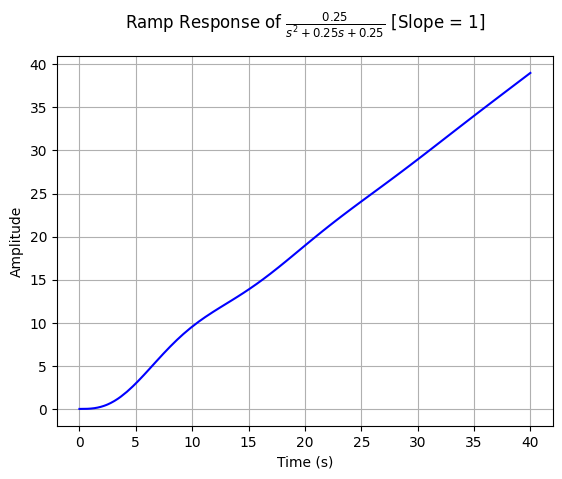

In [15]:
ramp_response_plot(tf1,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

Ahora, para sistema de amortiguamiento crítico:

$$\xi=1$$

$$\frac{a_1}{2 a_2 \sqrt{\frac {a_0} {a_2}}}=1$$

$$\frac{c}{2 m\sqrt{\frac {k} {m}}}=1$$

Asumimos:

$$c=2 = \frac{L}{R}$$

$L = 2$, $R=1$

$$k=1$$

$$m=1 = CL$$

$C=\frac{1}{2}$

$$\xi = \frac{2}{2}=1$$

In [16]:
#Reemplazando los valores
mck = {m: 1.0, c: 2.0, k: 1.0}
mck

{c: 2.0, k: 1.0, m: 1.0}

In [17]:
## Polos y ceros
print('p1=',p1.subs(mck))
print('p2=',p2.subs(mck))
print('xi=',xi.subs(mck))
print('omega_n=',wn.subs(mck))

p1= -1.00000000000000
p2= -1.00000000000000
xi= 1.00000000000000
omega_n= 1.00000000000000


In [18]:
t_s2 = 6*m / c
print('El tiempo de establecimiento es de: ',t_s.subs(mck))

El tiempo de establecimiento es de:  3.00000000000000


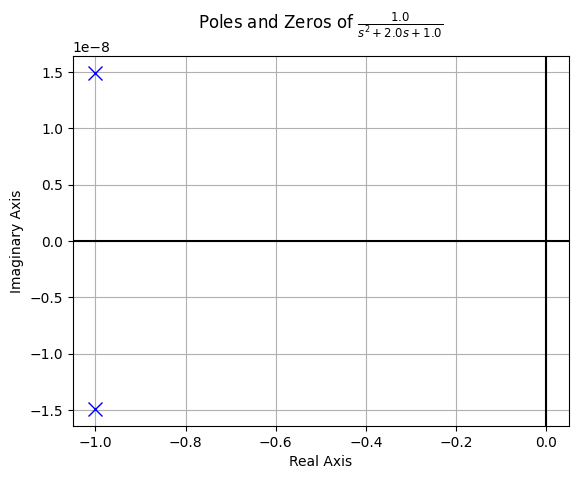

In [19]:
#gráfica polos y ceros paquete de control de sympy
from sympy.physics.control.lti import TransferFunction
from sympy.physics.control.control_plots import pole_zero_plot, bode_plot, impulse_response_plot, step_response_plot, ramp_response_plot
num,den=sym.fraction(H.subs(mck))

tf1 = TransferFunction(num, den, s)#numerados y denomirador función de transferencia con valores evaluados de RLC
pole_zero_plot(tf1)

#**Diagrama de bode**

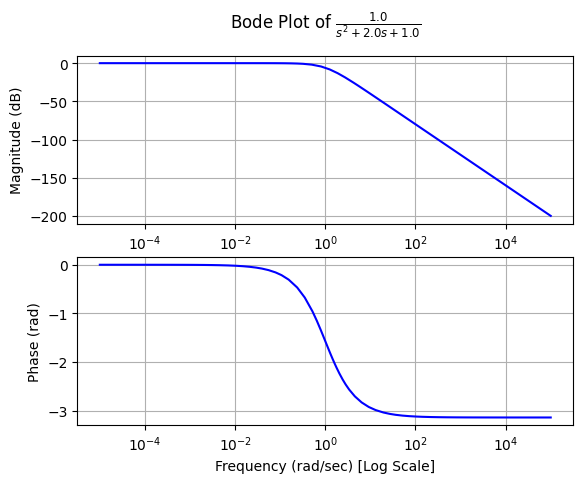

In [20]:
bode_plot(tf1)

#**Respuesta impulso**

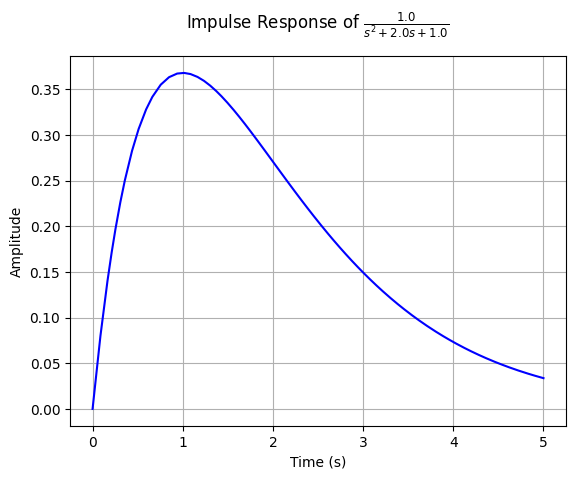

In [21]:
impulse_response_plot(tf1,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

#**Tiempo pico**

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import impulse, find_peaks

# Suponiendo que tf1 es tu función de transferencia
# (asegúrate de tener importada la función transfer_function)

# Definir la función de transferencia (sustituye tf1 con tu función)
numerator = [1]
denominator = [1, 2, 1]  # Sistema de segundo orden, por ejemplo

# Obtener la respuesta al impulso
time, response = impulse((numerator, denominator))

# Encontrar los picos en la respuesta al impulso
peaks, _ = find_peaks(response)

# Encontrar el tiempo correspondiente al primer pico
Tp = time[peaks[0]]
Tp

0.9898989898989898

#**Respuesta al escalón**

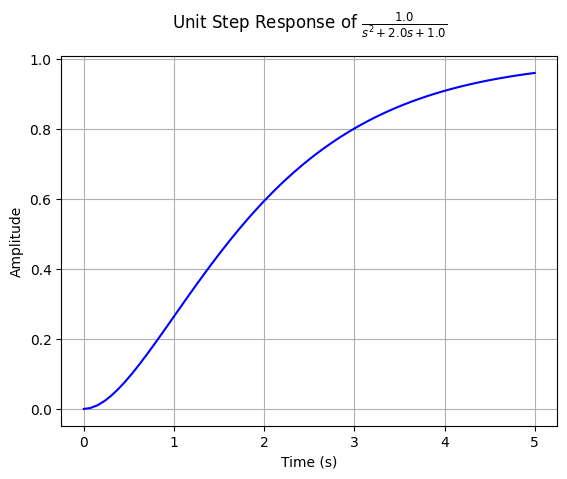

In [23]:
step_response_plot(tf1,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

#**Respuesta rampa**

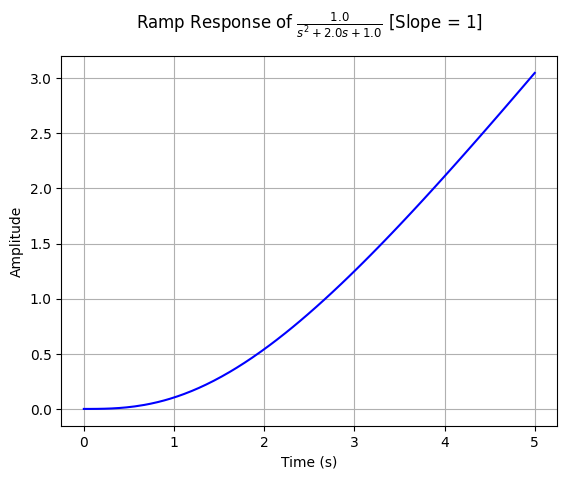

In [24]:
ramp_response_plot(tf1,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

#**Función de transferencia para masa resorte amortiguado lazo cerrado**

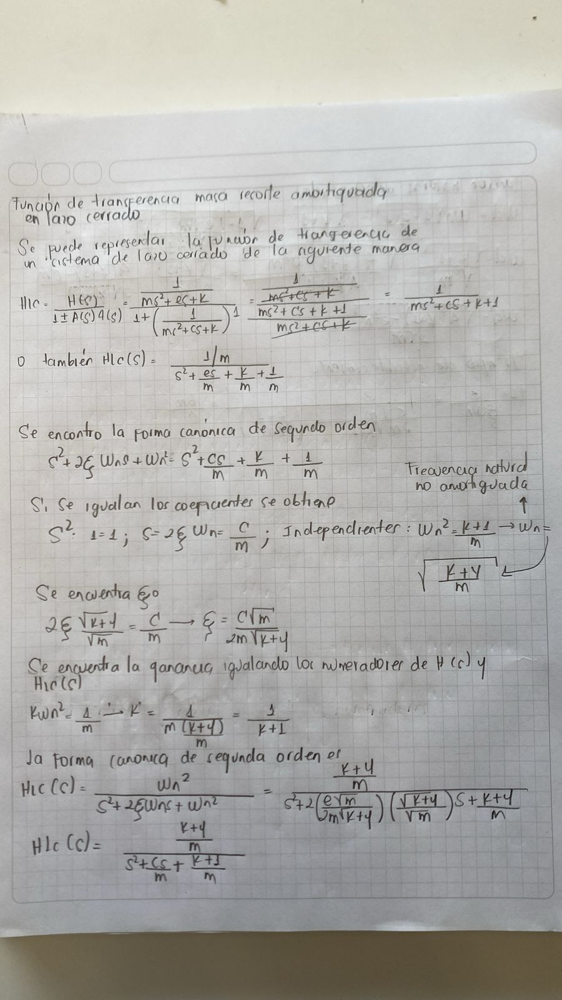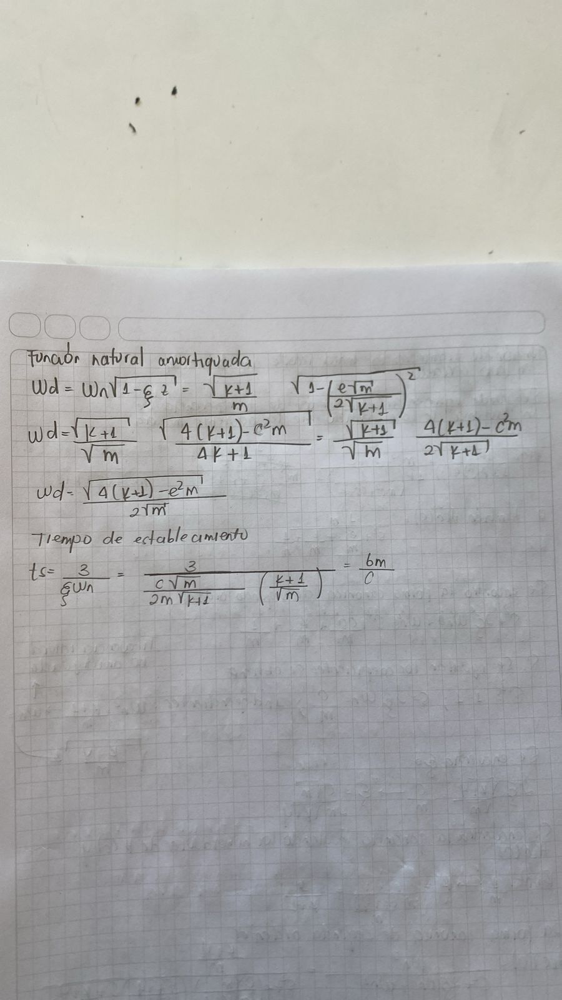

#**Simulación**

Teniendo en cuenta la forma canónica:

$$Hlc(s)=\frac{1}{a_2s^2+a_1s+a_0}$$

$$Hlc(s)=K\frac{\omega_n^2}{s^2+2\xi \omega_ns+\omega_n^2}$$

In [25]:
#forma canónica del slit
a2 = m #CL en circuito equivalente
a1 = c #L/R en circuito equivalente
ao = k + 1 # 1 en circuito equivalente

Ko = 1/ao #ganancia circuito forma canónica
wn = sym.sqrt(ao/a2)
xi = a1/(2*a2*sym.sqrt(ao/a2))
#función de transferencia
H = Ko*wn**2/(s**2+2*xi*wn*s+wn**2)
H

         1          
────────────────────
  ⎛c⋅s    2   k + 1⎞
m⋅⎜─── + s  + ─────⎟
  ⎝ m           m  ⎠

In [26]:
#calcular polos
p1 = -xi*wn + 1j*wn*sym.sqrt(1-xi**2)
p2 = -xi*wn - 1j*wn*sym.sqrt(1-xi**2)
p1

                             ___________________
                            ╱         2         
                _______    ╱         c          
        1.0⋅ⅈ⋅╲╱ k + 1 ⋅  ╱   - ─────────── + 1 
   c                    ╲╱      4⋅m⋅(k + 1)     
- ─── + ────────────────────────────────────────
  2⋅m                      √m                   

Ahora, para sistema subamortiguado:

$$0<\xi<1$$

$$0<\frac{c}{2 m\sqrt{\frac {k+1} {m}}}<1$$

Asumimos:

$$c=1 = \frac{L}{R}$$

$L = 1$, $R=1$

$$k=1$$

$$m=4 = CL$$

$C=4$

$$\xi = \frac{\sqrt{2}}{8}=0.17$$

In [27]:
#Reemplazando los valores
mck = {m: 4.0, c: 1.0, k: 1.0}
mck

{c: 1.0, k: 1.0, m: 4.0}

In [28]:
## Polos y ceros
print('p1=',p1.subs(mck))
print('p2=',p2.subs(mck))
print('xi=',xi.subs(mck))
print('omega_n=',wn.subs(mck))

p1= -0.125 + 0.695970545353753*I
p2= -0.125 - 0.695970545353753*I
xi= 0.176776695296637
omega_n= 0.707106781186548


In [29]:
t_s2 = 6*m / c
print('El tiempo de establecimiento es de: ',t_s.subs(mck))

El tiempo de establecimiento es de:  24.0000000000000


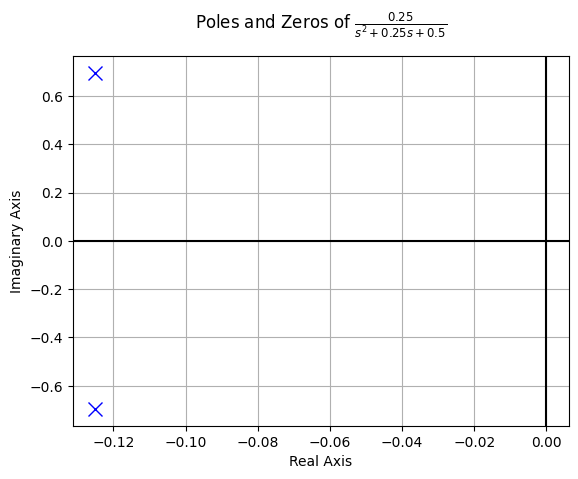

In [30]:
#gráfica polos y ceros paquete de control de sympy
from sympy.physics.control.lti import TransferFunction
from sympy.physics.control.control_plots import pole_zero_plot, bode_plot, impulse_response_plot, step_response_plot, ramp_response_plot
num,den=sym.fraction(H.subs(mck))

tf1 = TransferFunction(num, den, s)#numerados y denomirador función de transferencia con valores evaluados de RLC
pole_zero_plot(tf1)

#**Diagrama de bode**

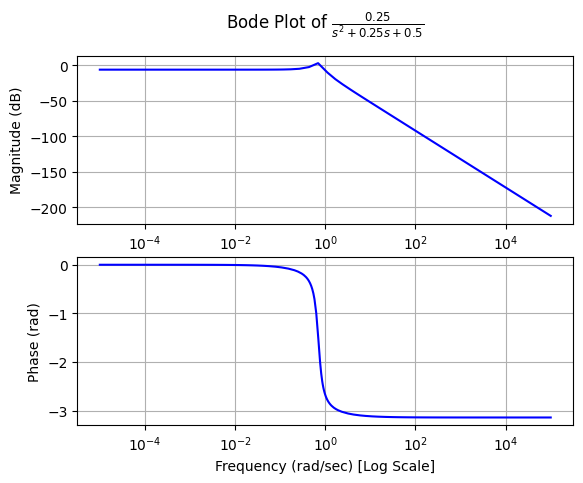

In [31]:
bode_plot(tf1)

#**Respuesta impulso**

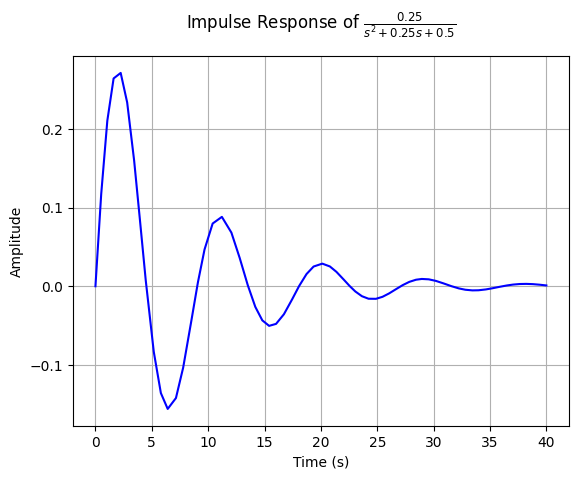

In [32]:
impulse_response_plot(tf1,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

#**Tiempo pico**

In [33]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import impulse, find_peaks

# Suponiendo que tf1 es tu función de transferencia
# (asegúrate de tener importada la función transfer_function)

# Definir la función de transferencia (sustituye tf1 con tu función)
numerator = [1]
denominator = [4, 1, 2]  # Sistema de segundo orden, por ejemplo

# Obtener la respuesta al impulso
time, response = impulse((numerator, denominator))

# Encontrar los picos en la respuesta al impulso
peaks, _ = find_peaks(response)

# Encontrar el tiempo correspondiente al primer pico
Tp = time[peaks[0]]
Tp

2.262626262626263

#**Respuesta al escalón**

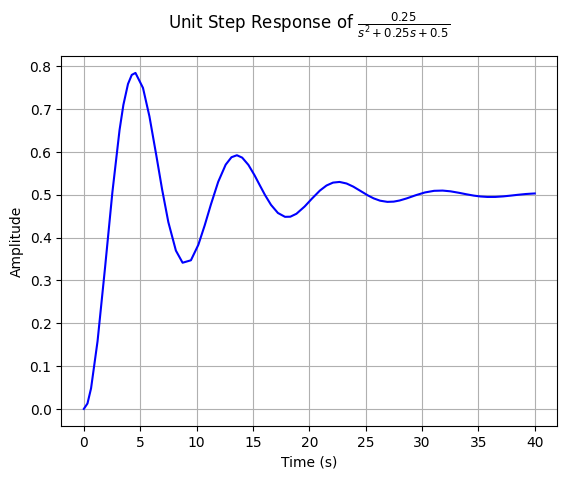

In [34]:
step_response_plot(tf1,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

#**Tiempo pico**

In [35]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import step, find_peaks

# Suponiendo que tf1 es tu función de transferencia
# (asegúrate de tener importada la función transfer_function)

# Definir la función de transferencia (sustituye tf1 con tu función)
numerator = [1]
denominator = [4, 1, 2]  # Sistema de segundo orden, por ejemplo

# Obtener la respuesta al impulso
time, response = step((numerator, denominator))

# Encontrar los picos en la respuesta al impulso
peaks, _ = find_peaks(response)

# Encontrar el tiempo correspondiente al primer pico
Tp = time[peaks[0]]
Tp

4.525252525252526

#**Respuesta rampa**

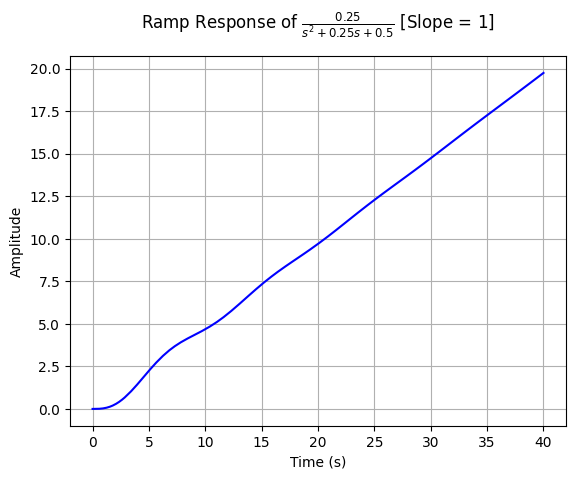

In [36]:
ramp_response_plot(tf1,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

Ahora, para sistema de amortiguamiento crítico:

$$\xi=1$$

$$\frac{a_1}{2 a_2 \sqrt{\frac {a_0} {a_2}}}=1$$

$$\frac{c}{2 m\sqrt{\frac {k+1} {m}}}=1$$

Asumimos:

$$c=4 = \frac{L}{R}$$

$L = 8$, $R=2$

$$k=1$$

$$m=2 = CL$$

$C=\frac{1}{4}$

$$\xi = \frac{4}{4}=1$$

In [37]:
#Reemplazando los valores
mck = {m: 2.0, c: 4.0, k: 1.0}
mck

{c: 4.0, k: 1.0, m: 2.0}

In [38]:
## Polos y ceros
print('p1=',p1.subs(mck))
print('p2=',p2.subs(mck))
print('xi=',xi.subs(mck))
print('omega_n=',wn.subs(mck))

p1= -1.00000000000000
p2= -1.00000000000000
xi= 1.00000000000000
omega_n= 1.00000000000000


In [39]:
t_s2 = 6*m / c
print('El tiempo de establecimiento es de: ',t_s.subs(mck))

El tiempo de establecimiento es de:  3.00000000000000


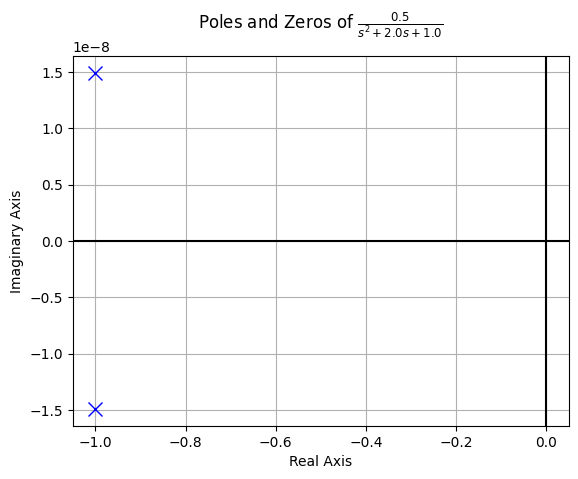

In [40]:
#gráfica polos y ceros paquete de control de sympy
from sympy.physics.control.lti import TransferFunction
from sympy.physics.control.control_plots import pole_zero_plot, bode_plot, impulse_response_plot, step_response_plot, ramp_response_plot
num,den=sym.fraction(H.subs(mck))

tf1 = TransferFunction(num, den, s)#numerados y denomirador función de transferencia con valores evaluados de RLC
pole_zero_plot(tf1)

#**Diagrama de bode**

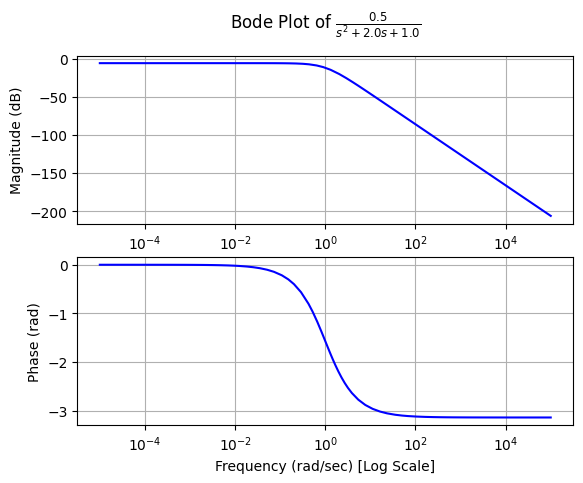

In [41]:
bode_plot(tf1)

#**Respuesta impulso**

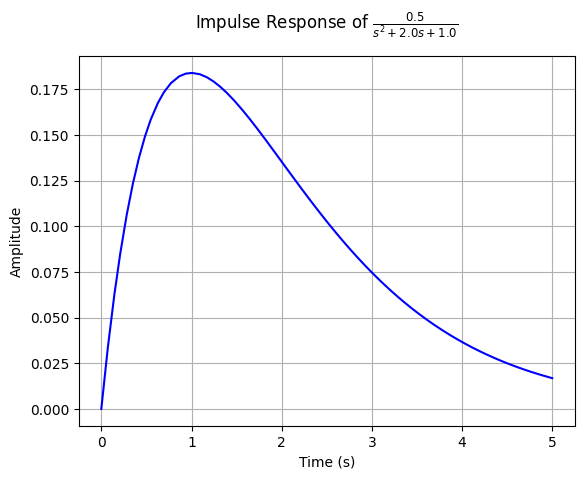

In [42]:
impulse_response_plot(tf1,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

#**Tiempo pico**

In [43]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import impulse, find_peaks

# Suponiendo que tf1 es tu función de transferencia
# (asegúrate de tener importada la función transfer_function)

# Definir la función de transferencia (sustituye tf1 con tu función)
numerator = [1]
denominator = [2, 4, 1]  # Sistema de segundo orden, por ejemplo

# Obtener la respuesta al impulso
time, response = impulse((numerator, denominator))

# Encontrar los picos en la respuesta al impulso
peaks, _ = find_peaks(response)

# Encontrar el tiempo correspondiente al primer pico
Tp = time[peaks[0]]
Tp

1.207045198818771

#**Respuesta al escalón**

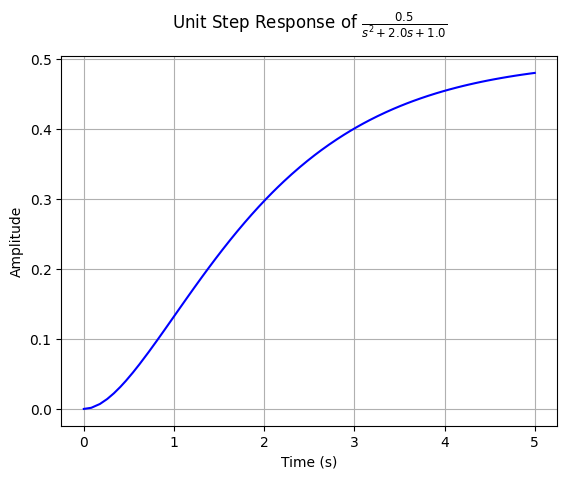

In [44]:
step_response_plot(tf1,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

#**Respuesta rampa**

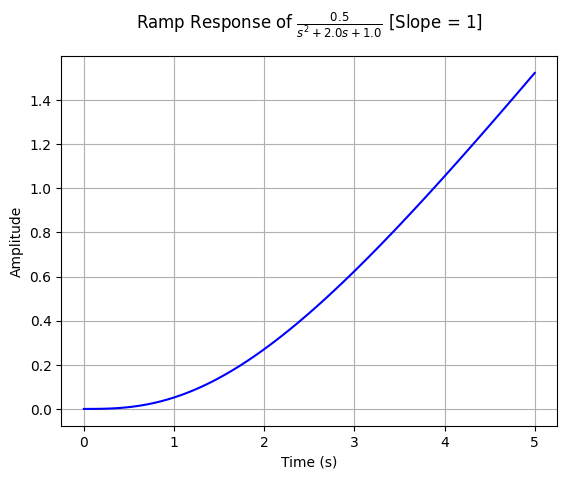

In [45]:
ramp_response_plot(tf1,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

**Punt 2.**
* Se descarga la canción de interes.

In [46]:
!python3 -m pip install --force-reinstall https://github.com/yt-dlp/yt-dlp/archive/master.tar.gz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 15.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.4/194.4 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 34.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.2/130.2 kB 13.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.5/162.5 kB 14.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.6/62.6 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.6/104.6 kB 11.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 78.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 142.1/142.1 kB 15.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.6/61.6 kB 6.1 MB/s eta 0:00:00
  Created w

In [47]:
#simulación con canción de youtube
#instalar api youtube-dl
import os
import yt_dlp as youtube_dl
def download_ytvid_as_mp3(video_url,name):
    #video_url = input("enter url of youtube video:")
    video_info = youtube_dl.YoutubeDL().extract_info(url = video_url,download=False)
    filename = f"{name}.mp3"
    options={
        'format':'bestaudio/best',
        'keepvideo':False,
        'outtmpl':filename,
    }

    with youtube_dl.YoutubeDL(options) as ydl:
        ydl.download([video_info['webpage_url']])

    print("Download complete... {}".format(filename))

In [48]:
#descargar canción de mi interés
link_= ["https://www.youtube.com/watch?v=xBpqkPl8E_Y&list=RDxAQGh0YmR84&index=3"]
name_ = ['Otro atardecer']
for name,link in zip(name_,link_):
    print(name)
    download_ytvid_as_mp3(link,name)

Otro atardecer
[youtube:tab] Extracting URL: https://www.youtube.com/watch?v=xBpqkPl8E_Y&list=RDxAQGh0YmR84&index=3
[youtube:tab] Downloading playlist RDxAQGh0YmR84 - add --no-playlist to download just the video xBpqkPl8E_Y
[youtube:tab] RDxAQGh0YmR84: Downloading webpage
[download] Downloading playlist: Mix - Bad Bunny - Un Coco (Audio)
[youtube:tab] RDxAQGh0YmR84 page 1: Downloading API JSON
[youtube:tab] RDxAQGh0YmR84 page 2: Downloading API JSON
[youtube:tab] RDxAQGh0YmR84 page 3: Downloading API JSON
[youtube:tab] RDxAQGh0YmR84 page 4: Downloading API JSON
[youtube:tab] RDxAQGh0YmR84 page 5: Downloading API JSON
[youtube:tab] RDxAQGh0YmR84 page 6: Downloading API JSON
[youtube:tab] RDxAQGh0YmR84 page 7: Downloading API JSON
[youtube:tab] RDxAQGh0YmR84 page 8: Downloading API JSON
[youtube:tab] RDxAQGh0YmR84 page 9: Downloading API JSON
[youtube:tab] RDxAQGh0YmR84 page 10: Downloading API JSON
[youtube:tab] RDxAQGh0YmR84 page 11: Downloading API JSON
[youtube:tab] RDxAQGh0YmR84 pag

[download] Downloading item 116 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=cD5T1Y4b7wA
[youtube] cD5T1Y4b7wA: Downloading webpage
[youtube] cD5T1Y4b7wA: Downloading ios player API JSON
[youtube] cD5T1Y4b7wA: Downloading android player API JSON
[youtube] cD5T1Y4b7wA: Downloading m3u8 information
[download] Downloading item 117 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=69lO08ar-mI
[youtube] 69lO08ar-mI: Downloading webpage
[youtube] 69lO08ar-mI: Downloading ios player API JSON
[youtube] 69lO08ar-mI: Downloading android player API JSON
[youtube] 69lO08ar-mI: Downloading m3u8 information
[download] Downloading item 118 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=Q4Js9OEODHM
[youtube] Q4Js9OEODHM: Downloading webpage
[youtube] Q4Js9OEODHM: Downloading ios player API JSON
[youtube] Q4Js9OEODHM: Downloading android player API JSON
[youtube] Q4Js9OEODHM: Downloading m3u8 information


[download] Downloading item 119 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=wAjHQXrIj9o
[youtube] wAjHQXrIj9o: Downloading webpage
[youtube] wAjHQXrIj9o: Downloading ios player API JSON
[youtube] wAjHQXrIj9o: Downloading android player API JSON
[youtube] wAjHQXrIj9o: Downloading m3u8 information


[download] Downloading item 120 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=ARWg160eaX4
[youtube] ARWg160eaX4: Downloading webpage
[youtube] ARWg160eaX4: Downloading ios player API JSON
[youtube] ARWg160eaX4: Downloading android player API JSON
[youtube] ARWg160eaX4: Downloading m3u8 information


[download] Downloading item 121 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=bef8QLNHubw
[youtube] bef8QLNHubw: Downloading webpage
[youtube] bef8QLNHubw: Downloading ios player API JSON
[youtube] bef8QLNHubw: Downloading android player API JSON
[youtube] bef8QLNHubw: Downloading m3u8 information


[download] Downloading item 122 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=acEOASYioGY
[youtube] acEOASYioGY: Downloading webpage
[youtube] acEOASYioGY: Downloading ios player API JSON
[youtube] acEOASYioGY: Downloading android player API JSON
[youtube] acEOASYioGY: Downloading m3u8 information
[download] Downloading item 123 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=wohwc9MQt6A
[youtube] wohwc9MQt6A: Downloading webpage
[youtube] wohwc9MQt6A: Downloading ios player API JSON
[youtube] wohwc9MQt6A: Downloading android player API JSON
[youtube] wohwc9MQt6A: Downloading m3u8 information
[download] Downloading item 124 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=Km4BayZykwE
[youtube] Km4BayZykwE: Downloading webpage
[youtube] Km4BayZykwE: Downloading ios player API JSON
[youtube] Km4BayZykwE: Downloading android player API JSON
[youtube] Km4BayZykwE: Downloading m3u8 information
[download] Downloading item 125 of 429
[youtub

[download] Downloading item 127 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=0JeughwzfR0
[youtube] 0JeughwzfR0: Downloading webpage
[youtube] 0JeughwzfR0: Downloading ios player API JSON
[youtube] 0JeughwzfR0: Downloading android player API JSON
[youtube] 0JeughwzfR0: Downloading m3u8 information
[download] Downloading item 128 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=jRxDUsGmwuc
[youtube] jRxDUsGmwuc: Downloading webpage
[youtube] jRxDUsGmwuc: Downloading ios player API JSON
[youtube] jRxDUsGmwuc: Downloading android player API JSON
[youtube] jRxDUsGmwuc: Downloading m3u8 information


[download] Downloading item 129 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=Ll2rA7IpeNI
[youtube] Ll2rA7IpeNI: Downloading webpage
[youtube] Ll2rA7IpeNI: Downloading ios player API JSON
[youtube] Ll2rA7IpeNI: Downloading android player API JSON
[youtube] Ll2rA7IpeNI: Downloading m3u8 information
[download] Downloading item 130 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=Cr8K88UcO0s
[youtube] Cr8K88UcO0s: Downloading webpage
[youtube] Cr8K88UcO0s: Downloading ios player API JSON
[youtube] Cr8K88UcO0s: Downloading android player API JSON
[youtube] Cr8K88UcO0s: Downloading m3u8 information
[download] Downloading item 131 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=IEWBKhSs4bs
[youtube] IEWBKhSs4bs: Downloading webpage
[youtube] IEWBKhSs4bs: Downloading ios player API JSON
[youtube] IEWBKhSs4bs: Downloading android player API JSON
[youtube] IEWBKhSs4bs: Downloading m3u8 information
[download] Downloading item 132 of 429
[youtub

[download] Downloading item 135 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=m3xFuFPxOnw
[youtube] m3xFuFPxOnw: Downloading webpage
[youtube] m3xFuFPxOnw: Downloading ios player API JSON
[youtube] m3xFuFPxOnw: Downloading android player API JSON
[youtube] m3xFuFPxOnw: Downloading m3u8 information


[download] Downloading item 136 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=8cKvvmPwgP4
[youtube] 8cKvvmPwgP4: Downloading webpage
[youtube] 8cKvvmPwgP4: Downloading ios player API JSON
[youtube] 8cKvvmPwgP4: Downloading android player API JSON
[youtube] 8cKvvmPwgP4: Downloading m3u8 information


[download] Downloading item 137 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=CbEst0K063c
[youtube] CbEst0K063c: Downloading webpage
[youtube] CbEst0K063c: Downloading ios player API JSON
[youtube] CbEst0K063c: Downloading android player API JSON
[youtube] CbEst0K063c: Downloading m3u8 information


[download] Downloading item 138 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=A_g3lMcWVy0
[youtube] A_g3lMcWVy0: Downloading webpage
[youtube] A_g3lMcWVy0: Downloading ios player API JSON
[youtube] A_g3lMcWVy0: Downloading android player API JSON
[youtube] A_g3lMcWVy0: Downloading m3u8 information


[download] Downloading item 139 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=3mchJ-EW9rM
[youtube] 3mchJ-EW9rM: Downloading webpage
[youtube] 3mchJ-EW9rM: Downloading ios player API JSON
[youtube] 3mchJ-EW9rM: Downloading android player API JSON
[youtube] 3mchJ-EW9rM: Downloading m3u8 information


[download] Downloading item 140 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=kLpH1nSLJSs
[youtube] kLpH1nSLJSs: Downloading webpage
[youtube] kLpH1nSLJSs: Downloading ios player API JSON
[youtube] kLpH1nSLJSs: Downloading android player API JSON
[youtube] kLpH1nSLJSs: Downloading m3u8 information
[info] Testing format 616
[info] Unable to download format 616. Skipping...
[download] Downloading item 141 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=CPK_IdHe1Yg
[youtube] CPK_IdHe1Yg: Downloading webpage
[youtube] CPK_IdHe1Yg: Downloading ios player API JSON
[youtube] CPK_IdHe1Yg: Downloading android player API JSON
[youtube] CPK_IdHe1Yg: Downloading m3u8 information


[download] Downloading item 142 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=1ooy2CyFLH4
[youtube] 1ooy2CyFLH4: Downloading webpage
[youtube] 1ooy2CyFLH4: Downloading ios player API JSON
[youtube] 1ooy2CyFLH4: Downloading android player API JSON
[youtube] 1ooy2CyFLH4: Downloading m3u8 information


[download] Downloading item 143 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=MkO9g3ywnG4
[youtube] MkO9g3ywnG4: Downloading webpage
[youtube] MkO9g3ywnG4: Downloading ios player API JSON
[youtube] MkO9g3ywnG4: Downloading android player API JSON
[youtube] MkO9g3ywnG4: Downloading m3u8 information
[download] Downloading item 144 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=WHejvUhX6rk
[youtube] WHejvUhX6rk: Downloading webpage
[youtube] WHejvUhX6rk: Downloading ios player API JSON
[youtube] WHejvUhX6rk: Downloading android player API JSON
[youtube] WHejvUhX6rk: Downloading m3u8 information
[download] Downloading item 145 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=oD5f55ohsc4
[youtube] oD5f55ohsc4: Downloading webpage
[youtube] oD5f55ohsc4: Downloading ios player API JSON
[youtube] oD5f55ohsc4: Downloading android player API JSON
[youtube] oD5f55ohsc4: Downloading m3u8 information


[download] Downloading item 146 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=2jYEz66J_J4
[youtube] 2jYEz66J_J4: Downloading webpage
[youtube] 2jYEz66J_J4: Downloading ios player API JSON
[youtube] 2jYEz66J_J4: Downloading android player API JSON
[youtube] 2jYEz66J_J4: Downloading m3u8 information


[download] Downloading item 147 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=OSUxrSe5GbI
[youtube] OSUxrSe5GbI: Downloading webpage
[youtube] OSUxrSe5GbI: Downloading ios player API JSON
[youtube] OSUxrSe5GbI: Downloading android player API JSON
[youtube] OSUxrSe5GbI: Downloading m3u8 information
[download] Downloading item 148 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=4KPbiiMcx1g
[youtube] 4KPbiiMcx1g: Downloading webpage
[youtube] 4KPbiiMcx1g: Downloading ios player API JSON
[youtube] 4KPbiiMcx1g: Downloading android player API JSON
[youtube] 4KPbiiMcx1g: Downloading m3u8 information


[download] Downloading item 149 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=7ouFkoU8Ap8
[youtube] 7ouFkoU8Ap8: Downloading webpage
[youtube] 7ouFkoU8Ap8: Downloading ios player API JSON
[youtube] 7ouFkoU8Ap8: Downloading android player API JSON
[youtube] 7ouFkoU8Ap8: Downloading m3u8 information


[download] Downloading item 150 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=7rbprAR_Reg
[youtube] 7rbprAR_Reg: Downloading webpage
[youtube] 7rbprAR_Reg: Downloading ios player API JSON
[youtube] 7rbprAR_Reg: Downloading android player API JSON
[youtube] 7rbprAR_Reg: Downloading m3u8 information
[download] Downloading item 151 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=PKoBuyUfQSo
[youtube] PKoBuyUfQSo: Downloading webpage
[youtube] PKoBuyUfQSo: Downloading ios player API JSON
[youtube] PKoBuyUfQSo: Downloading android player API JSON
[youtube] PKoBuyUfQSo: Downloading m3u8 information
[download] Downloading item 152 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=EB7G3fUUaeA
[youtube] EB7G3fUUaeA: Downloading webpage
[youtube] EB7G3fUUaeA: Downloading ios player API JSON
[youtube] EB7G3fUUaeA: Downloading android player API JSON
[youtube] EB7G3fUUaeA: Downloading m3u8 information


[download] Downloading item 153 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=P982oehprfY
[youtube] P982oehprfY: Downloading webpage
[youtube] P982oehprfY: Downloading ios player API JSON
[youtube] P982oehprfY: Downloading android player API JSON
[youtube] P982oehprfY: Downloading m3u8 information


[download] Downloading item 154 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=czx0dQe-3uk
[youtube] czx0dQe-3uk: Downloading webpage
[youtube] czx0dQe-3uk: Downloading ios player API JSON
[youtube] czx0dQe-3uk: Downloading android player API JSON
[youtube] czx0dQe-3uk: Downloading m3u8 information


[download] Downloading item 155 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=gjvTQTGogUM
[youtube] gjvTQTGogUM: Downloading webpage
[youtube] gjvTQTGogUM: Downloading ios player API JSON
[youtube] gjvTQTGogUM: Downloading android player API JSON
[youtube] gjvTQTGogUM: Downloading m3u8 information


[download] Downloading item 156 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=JUxITamPWrY
[youtube] JUxITamPWrY: Downloading webpage
[youtube] JUxITamPWrY: Downloading ios player API JSON
[youtube] JUxITamPWrY: Downloading android player API JSON
[youtube] JUxITamPWrY: Downloading m3u8 information
[download] Downloading item 157 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=kPc3Pe42bGI
[youtube] kPc3Pe42bGI: Downloading webpage
[youtube] kPc3Pe42bGI: Downloading ios player API JSON
[youtube] kPc3Pe42bGI: Downloading android player API JSON
[youtube] kPc3Pe42bGI: Downloading m3u8 information


[download] Downloading item 158 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=3inw26U-os4
[youtube] 3inw26U-os4: Downloading webpage
[youtube] 3inw26U-os4: Downloading ios player API JSON
[youtube] 3inw26U-os4: Downloading android player API JSON
[youtube] 3inw26U-os4: Downloading m3u8 information


[download] Downloading item 159 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=U68MJz9DrI4
[youtube] U68MJz9DrI4: Downloading webpage
[youtube] U68MJz9DrI4: Downloading ios player API JSON
[youtube] U68MJz9DrI4: Downloading android player API JSON
[youtube] U68MJz9DrI4: Downloading m3u8 information
[download] Downloading item 160 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=b8m9zhNAgKs
[youtube] b8m9zhNAgKs: Downloading webpage
[youtube] b8m9zhNAgKs: Downloading ios player API JSON
[youtube] b8m9zhNAgKs: Downloading android player API JSON
[youtube] b8m9zhNAgKs: Downloading m3u8 information
[download] Downloading item 161 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=hFCjGiawJi4
[youtube] hFCjGiawJi4: Downloading webpage
[youtube] hFCjGiawJi4: Downloading ios player API JSON
[youtube] hFCjGiawJi4: Downloading android player API JSON
[youtube] hFCjGiawJi4: Downloading m3u8 information


[download] Downloading item 162 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=TiM_TFpT_DE
[youtube] TiM_TFpT_DE: Downloading webpage
[youtube] TiM_TFpT_DE: Downloading ios player API JSON
[youtube] TiM_TFpT_DE: Downloading android player API JSON
[youtube] TiM_TFpT_DE: Downloading m3u8 information


[download] Downloading item 163 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=WZQf4c3F3kA
[youtube] WZQf4c3F3kA: Downloading webpage
[youtube] WZQf4c3F3kA: Downloading ios player API JSON
[youtube] WZQf4c3F3kA: Downloading android player API JSON
[youtube] WZQf4c3F3kA: Downloading m3u8 information
[download] Downloading item 164 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=cpgTIcxt9Hs
[youtube] cpgTIcxt9Hs: Downloading webpage
[youtube] cpgTIcxt9Hs: Downloading ios player API JSON
[youtube] cpgTIcxt9Hs: Downloading android player API JSON
[youtube] cpgTIcxt9Hs: Downloading m3u8 information


[download] Downloading item 165 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=w07y9YG-w_A
[youtube] w07y9YG-w_A: Downloading webpage
[youtube] w07y9YG-w_A: Downloading ios player API JSON
[youtube] w07y9YG-w_A: Downloading android player API JSON
[youtube] w07y9YG-w_A: Downloading m3u8 information
[download] Downloading item 166 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=ca48oMV59LU
[youtube] ca48oMV59LU: Downloading webpage
[youtube] ca48oMV59LU: Downloading ios player API JSON
[youtube] ca48oMV59LU: Downloading android player API JSON
[youtube] ca48oMV59LU: Downloading m3u8 information


[download] Downloading item 167 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=SK37InR9j38
[youtube] SK37InR9j38: Downloading webpage
[youtube] SK37InR9j38: Downloading ios player API JSON
[youtube] SK37InR9j38: Downloading android player API JSON
[youtube] SK37InR9j38: Downloading m3u8 information


[download] Downloading item 168 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=Ro18BjrfFg4
[youtube] Ro18BjrfFg4: Downloading webpage
[youtube] Ro18BjrfFg4: Downloading ios player API JSON
[youtube] Ro18BjrfFg4: Downloading android player API JSON
[youtube] Ro18BjrfFg4: Downloading m3u8 information
[download] Downloading item 169 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=guXD3jFW9jQ
[youtube] guXD3jFW9jQ: Downloading webpage
[youtube] guXD3jFW9jQ: Downloading ios player API JSON
[youtube] guXD3jFW9jQ: Downloading android player API JSON
[youtube] guXD3jFW9jQ: Downloading m3u8 information
[download] Downloading item 170 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=NKVI1zbtLHY
[youtube] NKVI1zbtLHY: Downloading webpage
[youtube] NKVI1zbtLHY: Downloading ios player API JSON
[youtube] NKVI1zbtLHY: Downloading android player API JSON
[youtube] NKVI1zbtLHY: Downloading m3u8 information
[download] Downloading item 171 of 429
[youtub

[download] Downloading item 172 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=QlZNGcVfeF0
[youtube] QlZNGcVfeF0: Downloading webpage
[youtube] QlZNGcVfeF0: Downloading ios player API JSON
[youtube] QlZNGcVfeF0: Downloading android player API JSON
[youtube] QlZNGcVfeF0: Downloading m3u8 information
[download] Downloading item 173 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=v5_SYkFpFiY
[youtube] v5_SYkFpFiY: Downloading webpage
[youtube] v5_SYkFpFiY: Downloading ios player API JSON
[youtube] v5_SYkFpFiY: Downloading android player API JSON
[youtube] v5_SYkFpFiY: Downloading m3u8 information
[download] Downloading item 174 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=jZGpkLElSu8
[youtube] jZGpkLElSu8: Downloading webpage
[youtube] jZGpkLElSu8: Downloading ios player API JSON
[youtube] jZGpkLElSu8: Downloading android player API JSON
[youtube] jZGpkLElSu8: Downloading m3u8 information
[download] Downloading item 175 of 429
[youtub

[download] Downloading item 178 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=Nguo5HVshY8
[youtube] Nguo5HVshY8: Downloading webpage
[youtube] Nguo5HVshY8: Downloading ios player API JSON
[youtube] Nguo5HVshY8: Downloading android player API JSON
[youtube] Nguo5HVshY8: Downloading m3u8 information
[download] Downloading item 179 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=hoQmSA6MRAk
[youtube] hoQmSA6MRAk: Downloading webpage
[youtube] hoQmSA6MRAk: Downloading ios player API JSON
[youtube] hoQmSA6MRAk: Downloading android player API JSON
[youtube] hoQmSA6MRAk: Downloading m3u8 information
[download] Downloading item 180 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=WILNIXZr2oc
[youtube] WILNIXZr2oc: Downloading webpage
[youtube] WILNIXZr2oc: Downloading ios player API JSON
[youtube] WILNIXZr2oc: Downloading android player API JSON
[youtube] WILNIXZr2oc: Downloading m3u8 information
[download] Downloading item 181 of 429
[youtub

[download] Downloading item 183 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=tnbpWZNAT_Y
[youtube] tnbpWZNAT_Y: Downloading webpage
[youtube] tnbpWZNAT_Y: Downloading ios player API JSON
[youtube] tnbpWZNAT_Y: Downloading android player API JSON
[youtube] tnbpWZNAT_Y: Downloading m3u8 information
[download] Downloading item 184 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=jCQ_6XbATPc
[youtube] jCQ_6XbATPc: Downloading webpage
[youtube] jCQ_6XbATPc: Downloading ios player API JSON
[youtube] jCQ_6XbATPc: Downloading android player API JSON
[youtube] jCQ_6XbATPc: Downloading m3u8 information


[download] Downloading item 185 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=xG9wDttvua8
[youtube] xG9wDttvua8: Downloading webpage
[youtube] xG9wDttvua8: Downloading ios player API JSON
[youtube] xG9wDttvua8: Downloading android player API JSON
[youtube] xG9wDttvua8: Downloading m3u8 information
[download] Downloading item 186 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=ox7RsX1Ee34
[youtube] ox7RsX1Ee34: Downloading webpage
[youtube] ox7RsX1Ee34: Downloading ios player API JSON
[youtube] ox7RsX1Ee34: Downloading android player API JSON
[youtube] ox7RsX1Ee34: Downloading m3u8 information


[download] Downloading item 187 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=aV3l_X54bhc
[youtube] aV3l_X54bhc: Downloading webpage
[youtube] aV3l_X54bhc: Downloading ios player API JSON
[youtube] aV3l_X54bhc: Downloading android player API JSON
[youtube] aV3l_X54bhc: Downloading m3u8 information
[download] Downloading item 188 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=Jr2LfFnOoiU
[youtube] Jr2LfFnOoiU: Downloading webpage
[youtube] Jr2LfFnOoiU: Downloading ios player API JSON
[youtube] Jr2LfFnOoiU: Downloading android player API JSON
[youtube] Jr2LfFnOoiU: Downloading m3u8 information
[download] Downloading item 189 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=Fw9xFEf4DSc
[youtube] Fw9xFEf4DSc: Downloading webpage
[youtube] Fw9xFEf4DSc: Downloading ios player API JSON
[youtube] Fw9xFEf4DSc: Downloading android player API JSON
[youtube] Fw9xFEf4DSc: Downloading m3u8 information
[download] Downloading item 190 of 429
[youtub

[download] Downloading item 191 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=SsKT0s5J8ko
[youtube] SsKT0s5J8ko: Downloading webpage
[youtube] SsKT0s5J8ko: Downloading ios player API JSON
[youtube] SsKT0s5J8ko: Downloading android player API JSON
[youtube] SsKT0s5J8ko: Downloading m3u8 information
[download] Downloading item 192 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=O1wUdB7MQbI
[youtube] O1wUdB7MQbI: Downloading webpage
[youtube] O1wUdB7MQbI: Downloading ios player API JSON
[youtube] O1wUdB7MQbI: Downloading android player API JSON
[youtube] O1wUdB7MQbI: Downloading m3u8 information
[download] Downloading item 193 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=hkrBbBJg3S4
[youtube] hkrBbBJg3S4: Downloading webpage
[youtube] hkrBbBJg3S4: Downloading ios player API JSON
[youtube] hkrBbBJg3S4: Downloading android player API JSON
[youtube] hkrBbBJg3S4: Downloading m3u8 information
[download] Downloading item 194 of 429
[youtub

[download] Downloading item 197 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=Y2QpQP8wPG8
[youtube] Y2QpQP8wPG8: Downloading webpage
[youtube] Y2QpQP8wPG8: Downloading ios player API JSON
[youtube] Y2QpQP8wPG8: Downloading android player API JSON
[youtube] Y2QpQP8wPG8: Downloading m3u8 information
[download] Downloading item 198 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=L7Vnp-S0xAE
[youtube] L7Vnp-S0xAE: Downloading webpage
[youtube] L7Vnp-S0xAE: Downloading ios player API JSON
[youtube] L7Vnp-S0xAE: Downloading android player API JSON
[youtube] L7Vnp-S0xAE: Downloading m3u8 information
[download] Downloading item 199 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=y8trd3gjJt0
[youtube] y8trd3gjJt0: Downloading webpage
[youtube] y8trd3gjJt0: Downloading ios player API JSON
[youtube] y8trd3gjJt0: Downloading android player API JSON
[youtube] y8trd3gjJt0: Downloading m3u8 information
[download] Downloading item 200 of 429
[youtub

[download] Downloading item 202 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=-4kAkkIw8JI
[youtube] -4kAkkIw8JI: Downloading webpage
[youtube] -4kAkkIw8JI: Downloading ios player API JSON
[youtube] -4kAkkIw8JI: Downloading android player API JSON
[youtube] -4kAkkIw8JI: Downloading m3u8 information


[download] Downloading item 203 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=BeUOBoSPWvA
[youtube] BeUOBoSPWvA: Downloading webpage
[youtube] BeUOBoSPWvA: Downloading ios player API JSON
[youtube] BeUOBoSPWvA: Downloading android player API JSON
[youtube] BeUOBoSPWvA: Downloading m3u8 information
[download] Downloading item 204 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=T8nbNQpRwNo
[youtube] T8nbNQpRwNo: Downloading webpage
[youtube] T8nbNQpRwNo: Downloading ios player API JSON
[youtube] T8nbNQpRwNo: Downloading android player API JSON
[youtube] T8nbNQpRwNo: Downloading m3u8 information
[download] Downloading item 205 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=GF8aaTu2kg0
[youtube] GF8aaTu2kg0: Downloading webpage
[youtube] GF8aaTu2kg0: Downloading ios player API JSON
[youtube] GF8aaTu2kg0: Downloading android player API JSON
[youtube] GF8aaTu2kg0: Downloading m3u8 information
[download] Downloading item 206 of 429
[youtub

[download] Downloading item 217 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=NQbkGDoD7B0
[youtube] NQbkGDoD7B0: Downloading webpage
[youtube] NQbkGDoD7B0: Downloading ios player API JSON
[youtube] NQbkGDoD7B0: Downloading android player API JSON
[youtube] NQbkGDoD7B0: Downloading m3u8 information
[download] Downloading item 218 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=8ttz1wdViys
[youtube] 8ttz1wdViys: Downloading webpage
[youtube] 8ttz1wdViys: Downloading ios player API JSON
[youtube] 8ttz1wdViys: Downloading android player API JSON
[youtube] 8ttz1wdViys: Downloading m3u8 information
[download] Downloading item 219 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=HBdEkUgX95k
[youtube] HBdEkUgX95k: Downloading webpage
[youtube] HBdEkUgX95k: Downloading ios player API JSON
[youtube] HBdEkUgX95k: Downloading android player API JSON
[youtube] HBdEkUgX95k: Downloading m3u8 information
[download] Downloading item 220 of 429
[youtub

[download] Downloading item 271 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=eBSQug_xtwc
[youtube] eBSQug_xtwc: Downloading webpage
[youtube] eBSQug_xtwc: Downloading ios player API JSON
[youtube] eBSQug_xtwc: Downloading android player API JSON
[youtube] eBSQug_xtwc: Downloading m3u8 information
[download] Downloading item 272 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=CocEMWdc7Ck
[youtube] CocEMWdc7Ck: Downloading webpage
[youtube] CocEMWdc7Ck: Downloading ios player API JSON
[youtube] CocEMWdc7Ck: Downloading android player API JSON
[youtube] CocEMWdc7Ck: Downloading m3u8 information
[download] Downloading item 273 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=Mb7PcCBkWho
[youtube] Mb7PcCBkWho: Downloading webpage
[youtube] Mb7PcCBkWho: Downloading ios player API JSON
[youtube] Mb7PcCBkWho: Downloading android player API JSON
[youtube] Mb7PcCBkWho: Downloading m3u8 information
[download] Downloading item 274 of 429
[youtub

[download] Downloading item 276 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=1Eops1caFVM
[youtube] 1Eops1caFVM: Downloading webpage
[youtube] 1Eops1caFVM: Downloading ios player API JSON
[youtube] 1Eops1caFVM: Downloading android player API JSON
[youtube] 1Eops1caFVM: Downloading m3u8 information
[download] Downloading item 277 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=M7fvzLV10n0
[youtube] M7fvzLV10n0: Downloading webpage
[youtube] M7fvzLV10n0: Downloading ios player API JSON
[youtube] M7fvzLV10n0: Downloading android player API JSON
[youtube] M7fvzLV10n0: Downloading m3u8 information


[download] Downloading item 278 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=rnO-MflYxCw
[youtube] rnO-MflYxCw: Downloading webpage
[youtube] rnO-MflYxCw: Downloading ios player API JSON
[youtube] rnO-MflYxCw: Downloading android player API JSON
[youtube] rnO-MflYxCw: Downloading m3u8 information


[download] Downloading item 279 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=rG49F1WNaTw
[youtube] rG49F1WNaTw: Downloading webpage
[youtube] rG49F1WNaTw: Downloading ios player API JSON
[youtube] rG49F1WNaTw: Downloading android player API JSON
[youtube] rG49F1WNaTw: Downloading m3u8 information
[download] Downloading item 280 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=yJOQ0acffwE
[youtube] yJOQ0acffwE: Downloading webpage
[youtube] yJOQ0acffwE: Downloading ios player API JSON
[youtube] yJOQ0acffwE: Downloading android player API JSON
[youtube] yJOQ0acffwE: Downloading m3u8 information
[download] Downloading item 281 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=tVthyPOWc-E
[youtube] tVthyPOWc-E: Downloading webpage
[youtube] tVthyPOWc-E: Downloading ios player API JSON
[youtube] tVthyPOWc-E: Downloading android player API JSON
[youtube] tVthyPOWc-E: Downloading m3u8 information
[download] Downloading item 282 of 429
[youtub

[download] Downloading item 286 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=j3OzH8URrng
[youtube] j3OzH8URrng: Downloading webpage
[youtube] j3OzH8URrng: Downloading ios player API JSON
[youtube] j3OzH8URrng: Downloading android player API JSON
[youtube] j3OzH8URrng: Downloading m3u8 information
[download] Downloading item 287 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=bHRv-EIuKJ8
[youtube] bHRv-EIuKJ8: Downloading webpage
[youtube] bHRv-EIuKJ8: Downloading ios player API JSON
[youtube] bHRv-EIuKJ8: Downloading android player API JSON
[youtube] bHRv-EIuKJ8: Downloading m3u8 information


[download] Downloading item 288 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=V6QrslxNge0
[youtube] V6QrslxNge0: Downloading webpage
[youtube] V6QrslxNge0: Downloading ios player API JSON
[youtube] V6QrslxNge0: Downloading android player API JSON
[youtube] V6QrslxNge0: Downloading m3u8 information
[download] Downloading item 289 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=iO5IsdJQBUI
[youtube] iO5IsdJQBUI: Downloading webpage
[youtube] iO5IsdJQBUI: Downloading ios player API JSON
[youtube] iO5IsdJQBUI: Downloading android player API JSON
[youtube] iO5IsdJQBUI: Downloading m3u8 information
[info] Testing format 616
[info] Unable to download format 616. Skipping...
[download] Downloading item 290 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=l6zyxURZkqo
[youtube] l6zyxURZkqo: Downloading webpage
[youtube] l6zyxURZkqo: Downloading ios player API JSON
[youtube] l6zyxURZkqo: Downloading android player API JSON
[youtube] l6zyxURZkqo:

[download] Downloading item 291 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=zGUdyDUkOZ0
[youtube] zGUdyDUkOZ0: Downloading webpage
[youtube] zGUdyDUkOZ0: Downloading ios player API JSON
[youtube] zGUdyDUkOZ0: Downloading android player API JSON
[youtube] zGUdyDUkOZ0: Downloading m3u8 information
[download] Downloading item 292 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=pXSY_NW73Eo
[youtube] pXSY_NW73Eo: Downloading webpage
[youtube] pXSY_NW73Eo: Downloading ios player API JSON
[youtube] pXSY_NW73Eo: Downloading android player API JSON
[youtube] pXSY_NW73Eo: Downloading m3u8 information
[info] Testing format 616
[download] Downloading item 293 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=-RPh7wy84DQ
[youtube] -RPh7wy84DQ: Downloading webpage
[youtube] -RPh7wy84DQ: Downloading ios player API JSON
[youtube] -RPh7wy84DQ: Downloading android player API JSON
[youtube] -RPh7wy84DQ: Downloading m3u8 information
[download] Downloadi

[download] Downloading item 295 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=E_CVcXtCjnU
[youtube] E_CVcXtCjnU: Downloading webpage
[youtube] E_CVcXtCjnU: Downloading ios player API JSON
[youtube] E_CVcXtCjnU: Downloading android player API JSON
[youtube] E_CVcXtCjnU: Downloading m3u8 information


[download] Downloading item 296 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=wc7JPaRV5uU
[youtube] wc7JPaRV5uU: Downloading webpage
[youtube] wc7JPaRV5uU: Downloading ios player API JSON
[youtube] wc7JPaRV5uU: Downloading android player API JSON
[youtube] wc7JPaRV5uU: Downloading m3u8 information
[download] Downloading item 297 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=D6vCMxmkMKI
[youtube] D6vCMxmkMKI: Downloading webpage
[youtube] D6vCMxmkMKI: Downloading ios player API JSON
[youtube] D6vCMxmkMKI: Downloading android player API JSON
[youtube] D6vCMxmkMKI: Downloading m3u8 information


[download] Downloading item 298 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=8AiJbln091M
[youtube] 8AiJbln091M: Downloading webpage
[youtube] 8AiJbln091M: Downloading ios player API JSON
[youtube] 8AiJbln091M: Downloading android player API JSON
[youtube] 8AiJbln091M: Downloading m3u8 information
[download] Downloading item 299 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=Mr1cw_Cc7jc
[youtube] Mr1cw_Cc7jc: Downloading webpage
[youtube] Mr1cw_Cc7jc: Downloading ios player API JSON
[youtube] Mr1cw_Cc7jc: Downloading android player API JSON
[youtube] Mr1cw_Cc7jc: Downloading m3u8 information
[info] Testing format 616
[download] Downloading item 300 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=B6vZobXMflw
[youtube] B6vZobXMflw: Downloading webpage
[youtube] B6vZobXMflw: Downloading ios player API JSON
[youtube] B6vZobXMflw: Downloading android player API JSON
[youtube] B6vZobXMflw: Downloading m3u8 information
[download] Downloadi

[download] Downloading item 304 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=QA27OYutm9M
[youtube] QA27OYutm9M: Downloading webpage
[youtube] QA27OYutm9M: Downloading ios player API JSON
[youtube] QA27OYutm9M: Downloading android player API JSON
[youtube] QA27OYutm9M: Downloading m3u8 information
[download] Downloading item 305 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=KmmBIcrDe84
[youtube] KmmBIcrDe84: Downloading webpage
[youtube] KmmBIcrDe84: Downloading ios player API JSON
[youtube] KmmBIcrDe84: Downloading android player API JSON
[youtube] KmmBIcrDe84: Downloading m3u8 information
[download] Downloading item 306 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=WShMn9Zo4tI
[youtube] WShMn9Zo4tI: Downloading webpage
[youtube] WShMn9Zo4tI: Downloading ios player API JSON
[youtube] WShMn9Zo4tI: Downloading android player API JSON
[youtube] WShMn9Zo4tI: Downloading m3u8 information


[download] Downloading item 307 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=1ZfjB5P7RS0
[youtube] 1ZfjB5P7RS0: Downloading webpage
[youtube] 1ZfjB5P7RS0: Downloading ios player API JSON
[youtube] 1ZfjB5P7RS0: Downloading android player API JSON
[youtube] 1ZfjB5P7RS0: Downloading m3u8 information


[download] Downloading item 308 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=-p1ZBVkEEpc
[youtube] -p1ZBVkEEpc: Downloading webpage
[youtube] -p1ZBVkEEpc: Downloading ios player API JSON
[youtube] -p1ZBVkEEpc: Downloading android player API JSON
[youtube] -p1ZBVkEEpc: Downloading m3u8 information
[download] Downloading item 309 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=T4CEq1nK8rY
[youtube] T4CEq1nK8rY: Downloading webpage
[youtube] T4CEq1nK8rY: Downloading ios player API JSON
[youtube] T4CEq1nK8rY: Downloading android player API JSON
[youtube] T4CEq1nK8rY: Downloading m3u8 information
[download] Downloading item 310 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=1YEZxCNeiMI
[youtube] 1YEZxCNeiMI: Downloading webpage
[youtube] 1YEZxCNeiMI: Downloading ios player API JSON
[youtube] 1YEZxCNeiMI: Downloading android player API JSON
[youtube] 1YEZxCNeiMI: Downloading m3u8 information
[download] Downloading item 311 of 429
[youtub

[download] Downloading item 312 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=4awyKrjzCg0
[youtube] 4awyKrjzCg0: Downloading webpage
[youtube] 4awyKrjzCg0: Downloading ios player API JSON
[youtube] 4awyKrjzCg0: Downloading android player API JSON
[youtube] 4awyKrjzCg0: Downloading m3u8 information
[download] Downloading item 313 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=5S5KbIDkRDQ
[youtube] 5S5KbIDkRDQ: Downloading webpage
[youtube] 5S5KbIDkRDQ: Downloading ios player API JSON
[youtube] 5S5KbIDkRDQ: Downloading android player API JSON
[youtube] 5S5KbIDkRDQ: Downloading m3u8 information
[download] Downloading item 314 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=WL-3zvnUomk
[youtube] WL-3zvnUomk: Downloading webpage
[youtube] WL-3zvnUomk: Downloading ios player API JSON
[youtube] WL-3zvnUomk: Downloading android player API JSON
[youtube] WL-3zvnUomk: Downloading m3u8 information


[download] Downloading item 315 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=GmZsYYI1Vnc
[youtube] GmZsYYI1Vnc: Downloading webpage
[youtube] GmZsYYI1Vnc: Downloading ios player API JSON
[youtube] GmZsYYI1Vnc: Downloading android player API JSON
[youtube] GmZsYYI1Vnc: Downloading m3u8 information
[download] Downloading item 316 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=NomGdaA-g0w
[youtube] NomGdaA-g0w: Downloading webpage
[youtube] NomGdaA-g0w: Downloading ios player API JSON
[youtube] NomGdaA-g0w: Downloading android player API JSON
[youtube] NomGdaA-g0w: Downloading m3u8 information


[download] Downloading item 317 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=27Iec5ABk18
[youtube] 27Iec5ABk18: Downloading webpage
[youtube] 27Iec5ABk18: Downloading ios player API JSON
[youtube] 27Iec5ABk18: Downloading android player API JSON
[youtube] 27Iec5ABk18: Downloading m3u8 information
[download] Downloading item 318 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=pQq9eP5OFhw
[youtube] pQq9eP5OFhw: Downloading webpage
[youtube] pQq9eP5OFhw: Downloading ios player API JSON
[youtube] pQq9eP5OFhw: Downloading android player API JSON
[youtube] pQq9eP5OFhw: Downloading m3u8 information
[info] Testing format 616
[download] Downloading item 319 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=CXtuceFNwUo
[youtube] CXtuceFNwUo: Downloading webpage
[youtube] CXtuceFNwUo: Downloading ios player API JSON
[youtube] CXtuceFNwUo: Downloading android player API JSON
[youtube] CXtuceFNwUo: Downloading m3u8 information
[download] Downloadi

[download] Downloading item 322 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=HzelqFG928I
[youtube] HzelqFG928I: Downloading webpage
[youtube] HzelqFG928I: Downloading ios player API JSON
[youtube] HzelqFG928I: Downloading android player API JSON
[youtube] HzelqFG928I: Downloading m3u8 information
[download] Downloading item 323 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=UJ835PU_DNs
[youtube] UJ835PU_DNs: Downloading webpage
[youtube] UJ835PU_DNs: Downloading ios player API JSON
[youtube] UJ835PU_DNs: Downloading android player API JSON
[youtube] UJ835PU_DNs: Downloading m3u8 information


[download] Downloading item 324 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=Lgpm7e17kvQ
[youtube] Lgpm7e17kvQ: Downloading webpage
[youtube] Lgpm7e17kvQ: Downloading ios player API JSON
[youtube] Lgpm7e17kvQ: Downloading android player API JSON
[youtube] Lgpm7e17kvQ: Downloading m3u8 information
[download] Downloading item 325 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=13m9v78uNJk
[youtube] 13m9v78uNJk: Downloading webpage
[youtube] 13m9v78uNJk: Downloading ios player API JSON
[youtube] 13m9v78uNJk: Downloading android player API JSON
[youtube] 13m9v78uNJk: Downloading m3u8 information


[download] Downloading item 326 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=8G8lSXmB72k
[youtube] 8G8lSXmB72k: Downloading webpage
[youtube] 8G8lSXmB72k: Downloading ios player API JSON
[youtube] 8G8lSXmB72k: Downloading android player API JSON
[youtube] 8G8lSXmB72k: Downloading m3u8 information
[download] Downloading item 327 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=S_bZJVaE7yI
[youtube] S_bZJVaE7yI: Downloading webpage
[youtube] S_bZJVaE7yI: Downloading ios player API JSON
[youtube] S_bZJVaE7yI: Downloading android player API JSON
[youtube] S_bZJVaE7yI: Downloading m3u8 information
[download] Downloading item 328 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=grgskIt0UY4
[youtube] grgskIt0UY4: Downloading webpage
[youtube] grgskIt0UY4: Downloading ios player API JSON
[youtube] grgskIt0UY4: Downloading android player API JSON
[youtube] grgskIt0UY4: Downloading m3u8 information


[download] Downloading item 329 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=gPH161ccsUY
[youtube] gPH161ccsUY: Downloading webpage
[youtube] gPH161ccsUY: Downloading ios player API JSON
[youtube] gPH161ccsUY: Downloading android player API JSON
[youtube] gPH161ccsUY: Downloading m3u8 information


[download] Downloading item 330 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=odbuKY5ekXY
[youtube] odbuKY5ekXY: Downloading webpage
[youtube] odbuKY5ekXY: Downloading ios player API JSON
[youtube] odbuKY5ekXY: Downloading android player API JSON
[youtube] odbuKY5ekXY: Downloading m3u8 information
[download] Downloading item 331 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=KKqV5q-w7_A
[youtube] KKqV5q-w7_A: Downloading webpage
[youtube] KKqV5q-w7_A: Downloading ios player API JSON
[youtube] KKqV5q-w7_A: Downloading android player API JSON
[youtube] KKqV5q-w7_A: Downloading m3u8 information


[download] Downloading item 332 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=KMR7PsUfHDo
[youtube] KMR7PsUfHDo: Downloading webpage
[youtube] KMR7PsUfHDo: Downloading ios player API JSON
[youtube] KMR7PsUfHDo: Downloading android player API JSON
[youtube] KMR7PsUfHDo: Downloading m3u8 information


[download] Downloading item 333 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=MwQFFrEVors
[youtube] MwQFFrEVors: Downloading webpage
[youtube] MwQFFrEVors: Downloading ios player API JSON
[youtube] MwQFFrEVors: Downloading android player API JSON
[youtube] MwQFFrEVors: Downloading m3u8 information


[download] Downloading item 334 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=AfRdRXCo3IU
[youtube] AfRdRXCo3IU: Downloading webpage
[youtube] AfRdRXCo3IU: Downloading ios player API JSON
[youtube] AfRdRXCo3IU: Downloading android player API JSON
[youtube] AfRdRXCo3IU: Downloading m3u8 information


[download] Downloading item 335 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=4DV9EfmawLI
[youtube] 4DV9EfmawLI: Downloading webpage
[youtube] 4DV9EfmawLI: Downloading ios player API JSON
[youtube] 4DV9EfmawLI: Downloading android player API JSON
[youtube] 4DV9EfmawLI: Downloading m3u8 information
[download] Downloading item 336 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=cQNhQcmUFo8
[youtube] cQNhQcmUFo8: Downloading webpage
[youtube] cQNhQcmUFo8: Downloading ios player API JSON
[youtube] cQNhQcmUFo8: Downloading android player API JSON
[youtube] cQNhQcmUFo8: Downloading m3u8 information
[download] Downloading item 337 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=4-rFLLoD8C0
[youtube] 4-rFLLoD8C0: Downloading webpage
[youtube] 4-rFLLoD8C0: Downloading ios player API JSON
[youtube] 4-rFLLoD8C0: Downloading android player API JSON
[youtube] 4-rFLLoD8C0: Downloading m3u8 information
[download] Downloading item 338 of 429
[youtub

[download] Downloading item 340 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=GmJkE-_mqT8
[youtube] GmJkE-_mqT8: Downloading webpage
[youtube] GmJkE-_mqT8: Downloading ios player API JSON
[youtube] GmJkE-_mqT8: Downloading android player API JSON
[youtube] GmJkE-_mqT8: Downloading m3u8 information
[download] Downloading item 341 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=sjNqRS22kAo
[youtube] sjNqRS22kAo: Downloading webpage
[youtube] sjNqRS22kAo: Downloading ios player API JSON
[youtube] sjNqRS22kAo: Downloading android player API JSON
[youtube] sjNqRS22kAo: Downloading m3u8 information


[download] Downloading item 342 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=ieC4FyyKMyw
[youtube] ieC4FyyKMyw: Downloading webpage
[youtube] ieC4FyyKMyw: Downloading ios player API JSON
[youtube] ieC4FyyKMyw: Downloading android player API JSON
[youtube] ieC4FyyKMyw: Downloading m3u8 information
[download] Downloading item 343 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=FTpOZOyY3JA
[youtube] FTpOZOyY3JA: Downloading webpage
[youtube] FTpOZOyY3JA: Downloading ios player API JSON
[youtube] FTpOZOyY3JA: Downloading android player API JSON
[youtube] FTpOZOyY3JA: Downloading m3u8 information
[download] Downloading item 344 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=flM8-rR0_O8
[youtube] flM8-rR0_O8: Downloading webpage
[youtube] flM8-rR0_O8: Downloading ios player API JSON
[youtube] flM8-rR0_O8: Downloading android player API JSON
[youtube] flM8-rR0_O8: Downloading m3u8 information
[download] Downloading item 345 of 429
[youtub

[download] Downloading item 347 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=NT1NpdNG0wU
[youtube] NT1NpdNG0wU: Downloading webpage
[youtube] NT1NpdNG0wU: Downloading ios player API JSON
[youtube] NT1NpdNG0wU: Downloading android player API JSON
[youtube] NT1NpdNG0wU: Downloading m3u8 information
[download] Downloading item 348 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=y3ru5NJ4yLs
[youtube] y3ru5NJ4yLs: Downloading webpage
[youtube] y3ru5NJ4yLs: Downloading ios player API JSON
[youtube] y3ru5NJ4yLs: Downloading android player API JSON
[youtube] y3ru5NJ4yLs: Downloading m3u8 information
[download] Downloading item 349 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=RenScMtAAXk
[youtube] RenScMtAAXk: Downloading webpage
[youtube] RenScMtAAXk: Downloading ios player API JSON
[youtube] RenScMtAAXk: Downloading android player API JSON
[youtube] RenScMtAAXk: Downloading m3u8 information
[download] Downloading item 350 of 429
[youtub

[download] Downloading item 356 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=OCPR7wCexps
[youtube] OCPR7wCexps: Downloading webpage
[youtube] OCPR7wCexps: Downloading ios player API JSON
[youtube] OCPR7wCexps: Downloading android player API JSON
[youtube] OCPR7wCexps: Downloading m3u8 information


[download] Downloading item 357 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=3JPxaBPaOz4
[youtube] 3JPxaBPaOz4: Downloading webpage
[youtube] 3JPxaBPaOz4: Downloading ios player API JSON
[youtube] 3JPxaBPaOz4: Downloading android player API JSON
[youtube] 3JPxaBPaOz4: Downloading m3u8 information
[download] Downloading item 358 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=xwnY-0mwMPU
[youtube] xwnY-0mwMPU: Downloading webpage
[youtube] xwnY-0mwMPU: Downloading ios player API JSON
[youtube] xwnY-0mwMPU: Downloading android player API JSON
[youtube] xwnY-0mwMPU: Downloading m3u8 information
[download] Downloading item 359 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=bQ5MACepXM8
[youtube] bQ5MACepXM8: Downloading webpage
[youtube] bQ5MACepXM8: Downloading ios player API JSON
[youtube] bQ5MACepXM8: Downloading android player API JSON
[youtube] bQ5MACepXM8: Downloading m3u8 information
[download] Downloading item 360 of 429
[youtub

[download] Downloading item 366 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=5VNqO6k8f9Q
[youtube] 5VNqO6k8f9Q: Downloading webpage
[youtube] 5VNqO6k8f9Q: Downloading ios player API JSON
[youtube] 5VNqO6k8f9Q: Downloading android player API JSON
[youtube] 5VNqO6k8f9Q: Downloading m3u8 information
[download] Downloading item 367 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=7Yc5qku63PI
[youtube] 7Yc5qku63PI: Downloading webpage
[youtube] 7Yc5qku63PI: Downloading ios player API JSON
[youtube] 7Yc5qku63PI: Downloading android player API JSON
[youtube] 7Yc5qku63PI: Downloading m3u8 information
[download] Downloading item 368 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=nBdFfXr9x8Q
[youtube] nBdFfXr9x8Q: Downloading webpage
[youtube] nBdFfXr9x8Q: Downloading ios player API JSON
[youtube] nBdFfXr9x8Q: Downloading android player API JSON
[youtube] nBdFfXr9x8Q: Downloading m3u8 information
[download] Downloading item 369 of 429
[youtub

[download] Downloading item 379 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=3Wnso2A4PZE
[youtube] 3Wnso2A4PZE: Downloading webpage
[youtube] 3Wnso2A4PZE: Downloading ios player API JSON
[youtube] 3Wnso2A4PZE: Downloading android player API JSON
[youtube] 3Wnso2A4PZE: Downloading m3u8 information
[download] Downloading item 380 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=o_1yMIdKtEE
[youtube] o_1yMIdKtEE: Downloading webpage
[youtube] o_1yMIdKtEE: Downloading ios player API JSON
[youtube] o_1yMIdKtEE: Downloading android player API JSON
[youtube] o_1yMIdKtEE: Downloading m3u8 information
[download] Downloading item 381 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=8HBcV0MtAQg
[youtube] 8HBcV0MtAQg: Downloading webpage
[youtube] 8HBcV0MtAQg: Downloading ios player API JSON
[youtube] 8HBcV0MtAQg: Downloading android player API JSON
[youtube] 8HBcV0MtAQg: Downloading m3u8 information
[download] Downloading item 382 of 429
[youtub

[download] Downloading item 383 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=lZiaYpD9ZrI
[youtube] lZiaYpD9ZrI: Downloading webpage
[youtube] lZiaYpD9ZrI: Downloading ios player API JSON
[youtube] lZiaYpD9ZrI: Downloading android player API JSON
[youtube] lZiaYpD9ZrI: Downloading m3u8 information
[download] Downloading item 384 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=XuUM270XfHU
[youtube] XuUM270XfHU: Downloading webpage
[youtube] XuUM270XfHU: Downloading ios player API JSON
[youtube] XuUM270XfHU: Downloading android player API JSON
[youtube] XuUM270XfHU: Downloading m3u8 information
[download] Downloading item 385 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=cDMhlvbOFaM
[youtube] cDMhlvbOFaM: Downloading webpage
[youtube] cDMhlvbOFaM: Downloading ios player API JSON
[youtube] cDMhlvbOFaM: Downloading android player API JSON
[youtube] cDMhlvbOFaM: Downloading m3u8 information
[download] Downloading item 386 of 429
[youtub

[download] Downloading item 393 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=Np1miR2k0b4
[youtube] Np1miR2k0b4: Downloading webpage
[youtube] Np1miR2k0b4: Downloading ios player API JSON
[youtube] Np1miR2k0b4: Downloading android player API JSON
[youtube] Np1miR2k0b4: Downloading m3u8 information
[download] Downloading item 394 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=qNPVyc-E3SU
[youtube] qNPVyc-E3SU: Downloading webpage
[youtube] qNPVyc-E3SU: Downloading ios player API JSON
[youtube] qNPVyc-E3SU: Downloading android player API JSON
[youtube] qNPVyc-E3SU: Downloading m3u8 information
[download] Downloading item 395 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=iOtRxcTMsHc
[youtube] iOtRxcTMsHc: Downloading webpage
[youtube] iOtRxcTMsHc: Downloading ios player API JSON
[youtube] iOtRxcTMsHc: Downloading android player API JSON
[youtube] iOtRxcTMsHc: Downloading m3u8 information
[download] Downloading item 396 of 429
[youtub

[download] Downloading item 406 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=tAxnFv2PV-Y
[youtube] tAxnFv2PV-Y: Downloading webpage
[youtube] tAxnFv2PV-Y: Downloading ios player API JSON
[youtube] tAxnFv2PV-Y: Downloading android player API JSON
[youtube] tAxnFv2PV-Y: Downloading m3u8 information
[download] Downloading item 407 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=gG3516BF5_w
[youtube] gG3516BF5_w: Downloading webpage
[youtube] gG3516BF5_w: Downloading ios player API JSON
[youtube] gG3516BF5_w: Downloading android player API JSON
[youtube] gG3516BF5_w: Downloading m3u8 information
[download] Downloading item 408 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=5ygomG_5nXo
[youtube] 5ygomG_5nXo: Downloading webpage
[youtube] 5ygomG_5nXo: Downloading ios player API JSON
[youtube] 5ygomG_5nXo: Downloading android player API JSON
[youtube] 5ygomG_5nXo: Downloading m3u8 information


[download] Downloading item 409 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=KfEEm4Zx-EU
[youtube] KfEEm4Zx-EU: Downloading webpage
[youtube] KfEEm4Zx-EU: Downloading ios player API JSON
[youtube] KfEEm4Zx-EU: Downloading android player API JSON
[youtube] KfEEm4Zx-EU: Downloading m3u8 information
[download] Downloading item 410 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=gfoD2ILKEYk
[youtube] gfoD2ILKEYk: Downloading webpage
[youtube] gfoD2ILKEYk: Downloading ios player API JSON
[youtube] gfoD2ILKEYk: Downloading android player API JSON
[youtube] gfoD2ILKEYk: Downloading m3u8 information
[download] Downloading item 411 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=5uBa5rrUifM
[youtube] 5uBa5rrUifM: Downloading webpage
[youtube] 5uBa5rrUifM: Downloading ios player API JSON
[youtube] 5uBa5rrUifM: Downloading android player API JSON
[youtube] 5uBa5rrUifM: Downloading m3u8 information
[download] Downloading item 412 of 429
[youtub

[download] Downloading item 414 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=x9sq06NTSXU
[youtube] x9sq06NTSXU: Downloading webpage
[youtube] x9sq06NTSXU: Downloading ios player API JSON
[youtube] x9sq06NTSXU: Downloading android player API JSON
[youtube] x9sq06NTSXU: Downloading m3u8 information
[download] Downloading item 415 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=T3bbIN_hNQ4
[youtube] T3bbIN_hNQ4: Downloading webpage
[youtube] T3bbIN_hNQ4: Downloading ios player API JSON
[youtube] T3bbIN_hNQ4: Downloading android player API JSON
[youtube] T3bbIN_hNQ4: Downloading m3u8 information
[download] Downloading item 416 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=B5ZQRwrKVjA
[youtube] B5ZQRwrKVjA: Downloading webpage
[youtube] B5ZQRwrKVjA: Downloading ios player API JSON
[youtube] B5ZQRwrKVjA: Downloading android player API JSON
[youtube] B5ZQRwrKVjA: Downloading m3u8 information
[download] Downloading item 417 of 429
[youtub

[download] Downloading item 424 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=o0tqEQ331go
[youtube] o0tqEQ331go: Downloading webpage
[youtube] o0tqEQ331go: Downloading ios player API JSON
[youtube] o0tqEQ331go: Downloading android player API JSON
[youtube] o0tqEQ331go: Downloading m3u8 information


[download] Downloading item 425 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=xdfik2FRhck
[youtube] xdfik2FRhck: Downloading webpage
[youtube] xdfik2FRhck: Downloading ios player API JSON
[youtube] xdfik2FRhck: Downloading android player API JSON
[youtube] xdfik2FRhck: Downloading m3u8 information
[download] Downloading item 426 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=mUZrMNhM7fE
[youtube] mUZrMNhM7fE: Downloading webpage
[youtube] mUZrMNhM7fE: Downloading ios player API JSON
[youtube] mUZrMNhM7fE: Downloading android player API JSON
[youtube] mUZrMNhM7fE: Downloading m3u8 information
[download] Downloading item 427 of 429
[youtube] Extracting URL: https://www.youtube.com/watch?v=Y4WaJGVoYMc
[youtube] Y4WaJGVoYMc: Downloading webpage
[youtube] Y4WaJGVoYMc: Downloading ios player API JSON
[youtube] Y4WaJGVoYMc: Downloading android player API JSON
[youtube] Y4WaJGVoYMc: Downloading m3u8 information
[download] Downloading item 428 of 429
[youtub

[info] acEOASYioGY: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 4 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=p38WgakuYDo
[youtube] p38WgakuYDo: Downloading webpage
[youtube] p38WgakuYDo: Downloading ios player API JSON
[youtube] p38WgakuYDo: Downloading android player API JSON
[youtube] p38WgakuYDo: Downloading m3u8 information
[info] p38WgakuYDo: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 5 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=yO-XR4qXm1k
[youtube] yO-XR4qXm1k: Downloading webpage
[youtube] yO-XR4qXm1k: Downloading ios player API JSON
[youtube] yO-XR4qXm1k: Downloading android player API JSON
[youtube] yO-XR4qXm1k: Downloading m3u8 information
[info] yO-XR4qXm1k: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already bee

[info] TmKh7lAwnBI: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 15 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=KywzeIM45FA
[youtube] KywzeIM45FA: Downloading webpage
[youtube] KywzeIM45FA: Downloading ios player API JSON
[youtube] KywzeIM45FA: Downloading android player API JSON
[youtube] KywzeIM45FA: Downloading m3u8 information
[info] KywzeIM45FA: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 16 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=HekrZ0QcI3g
[youtube] HekrZ0QcI3g: Downloading webpage
[youtube] HekrZ0QcI3g: Downloading ios player API JSON
[youtube] HekrZ0QcI3g: Downloading android player API JSON
[youtube] HekrZ0QcI3g: Downloading m3u8 information
[info] HekrZ0QcI3g: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already b

[info] EB7G3fUUaeA: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 23 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=P982oehprfY
[youtube] P982oehprfY: Downloading webpage
[youtube] P982oehprfY: Downloading ios player API JSON
[youtube] P982oehprfY: Downloading android player API JSON
[youtube] P982oehprfY: Downloading m3u8 information
[info] P982oehprfY: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 24 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=Q4Js9OEODHM
[youtube] Q4Js9OEODHM: Downloading webpage
[youtube] Q4Js9OEODHM: Downloading ios player API JSON
[youtube] Q4Js9OEODHM: Downloading android player API JSON
[youtube] Q4Js9OEODHM: Downloading m3u8 information
[info] Q4Js9OEODHM: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already b

[info] R82Pk0VQWOQ: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 45 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=DMrFMuUcM4o
[youtube] DMrFMuUcM4o: Downloading webpage
[youtube] DMrFMuUcM4o: Downloading ios player API JSON
[youtube] DMrFMuUcM4o: Downloading android player API JSON
[youtube] DMrFMuUcM4o: Downloading m3u8 information
[info] DMrFMuUcM4o: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 46 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=kPc3Pe42bGI
[youtube] kPc3Pe42bGI: Downloading webpage
[youtube] kPc3Pe42bGI: Downloading ios player API JSON
[youtube] kPc3Pe42bGI: Downloading android player API JSON
[youtube] kPc3Pe42bGI: Downloading m3u8 information
[info] kPc3Pe42bGI: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already b

[info] jRxDUsGmwuc: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 57 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=STtEbyXmYbE
[youtube] STtEbyXmYbE: Downloading webpage
[youtube] STtEbyXmYbE: Downloading ios player API JSON
[youtube] STtEbyXmYbE: Downloading android player API JSON
[youtube] STtEbyXmYbE: Downloading m3u8 information
[info] STtEbyXmYbE: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 58 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=PGJ43zaam_0
[youtube] PGJ43zaam_0: Downloading webpage
[youtube] PGJ43zaam_0: Downloading ios player API JSON
[youtube] PGJ43zaam_0: Downloading android player API JSON
[youtube] PGJ43zaam_0: Downloading m3u8 information
[info] PGJ43zaam_0: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already b

[info] LOYAomlRbxI: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 66 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=EZE62LpaqHg
[youtube] EZE62LpaqHg: Downloading webpage
[youtube] EZE62LpaqHg: Downloading ios player API JSON
[youtube] EZE62LpaqHg: Downloading android player API JSON
[youtube] EZE62LpaqHg: Downloading m3u8 information
[info] EZE62LpaqHg: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 67 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=4a4zu5t83yY
[youtube] 4a4zu5t83yY: Downloading webpage
[youtube] 4a4zu5t83yY: Downloading ios player API JSON
[youtube] 4a4zu5t83yY: Downloading android player API JSON
[youtube] 4a4zu5t83yY: Downloading m3u8 information
[info] 4a4zu5t83yY: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already b

[info] 13m9v78uNJk: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 72 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=ZAz3rnLGthg
[youtube] ZAz3rnLGthg: Downloading webpage
[youtube] ZAz3rnLGthg: Downloading ios player API JSON
[youtube] ZAz3rnLGthg: Downloading android player API JSON
[youtube] ZAz3rnLGthg: Downloading m3u8 information
[info] ZAz3rnLGthg: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 73 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=19y35jAcG6k
[youtube] 19y35jAcG6k: Downloading webpage
[youtube] 19y35jAcG6k: Downloading ios player API JSON
[youtube] 19y35jAcG6k: Downloading android player API JSON
[youtube] 19y35jAcG6k: Downloading m3u8 information


[info] 19y35jAcG6k: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 74 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=kH95f_yxQ1I
[youtube] kH95f_yxQ1I: Downloading webpage
[youtube] kH95f_yxQ1I: Downloading ios player API JSON
[youtube] kH95f_yxQ1I: Downloading android player API JSON
[youtube] kH95f_yxQ1I: Downloading m3u8 information
[info] kH95f_yxQ1I: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 75 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=iMOYZJq6XQo
[youtube] iMOYZJq6XQo: Downloading webpage
[youtube] iMOYZJq6XQo: Downloading ios player API JSON
[youtube] iMOYZJq6XQo: Downloading android player API JSON
[youtube] iMOYZJq6XQo: Downloading m3u8 information
[info] iMOYZJq6XQo: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already b

[info] grgskIt0UY4: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 78 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=ox7RsX1Ee34
[youtube] ox7RsX1Ee34: Downloading webpage
[youtube] ox7RsX1Ee34: Downloading ios player API JSON
[youtube] ox7RsX1Ee34: Downloading android player API JSON
[youtube] ox7RsX1Ee34: Downloading m3u8 information
[info] ox7RsX1Ee34: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 79 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=4KPbiiMcx1g
[youtube] 4KPbiiMcx1g: Downloading webpage
[youtube] 4KPbiiMcx1g: Downloading ios player API JSON
[youtube] 4KPbiiMcx1g: Downloading android player API JSON
[youtube] 4KPbiiMcx1g: Downloading m3u8 information
[info] 4KPbiiMcx1g: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already b

[info] jhMiIUb2GEA: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 82 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=qo_13jj-KDE
[youtube] qo_13jj-KDE: Downloading webpage
[youtube] qo_13jj-KDE: Downloading ios player API JSON
[youtube] qo_13jj-KDE: Downloading android player API JSON
[youtube] qo_13jj-KDE: Downloading m3u8 information
[info] qo_13jj-KDE: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 83 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=TiM_TFpT_DE
[youtube] TiM_TFpT_DE: Downloading webpage
[youtube] TiM_TFpT_DE: Downloading ios player API JSON
[youtube] TiM_TFpT_DE: Downloading android player API JSON
[youtube] TiM_TFpT_DE: Downloading m3u8 information
[info] TiM_TFpT_DE: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already b

[info] 0JeughwzfR0: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 100 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=hkrBbBJg3S4
[youtube] hkrBbBJg3S4: Downloading webpage
[youtube] hkrBbBJg3S4: Downloading ios player API JSON
[youtube] hkrBbBJg3S4: Downloading android player API JSON
[youtube] hkrBbBJg3S4: Downloading m3u8 information
[info] hkrBbBJg3S4: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 101 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=FFhGqNa-Waw
[youtube] FFhGqNa-Waw: Downloading webpage
[youtube] FFhGqNa-Waw: Downloading ios player API JSON
[youtube] FFhGqNa-Waw: Downloading android player API JSON
[youtube] FFhGqNa-Waw: Downloading m3u8 information
[info] FFhGqNa-Waw: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already

[info] jZGpkLElSu8: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 113 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=BeUOBoSPWvA
[youtube] BeUOBoSPWvA: Downloading webpage
[youtube] BeUOBoSPWvA: Downloading ios player API JSON
[youtube] BeUOBoSPWvA: Downloading android player API JSON
[youtube] BeUOBoSPWvA: Downloading m3u8 information
[info] BeUOBoSPWvA: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 114 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=CULF9lXH87w
[youtube] CULF9lXH87w: Downloading webpage
[youtube] CULF9lXH87w: Downloading ios player API JSON
[youtube] CULF9lXH87w: Downloading android player API JSON
[youtube] CULF9lXH87w: Downloading m3u8 information


[info] CULF9lXH87w: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 115 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=CXtuceFNwUo
[youtube] CXtuceFNwUo: Downloading webpage
[youtube] CXtuceFNwUo: Downloading ios player API JSON
[youtube] CXtuceFNwUo: Downloading android player API JSON
[youtube] CXtuceFNwUo: Downloading m3u8 information


[info] CXtuceFNwUo: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 116 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=V6QrslxNge0
[youtube] V6QrslxNge0: Downloading webpage
[youtube] V6QrslxNge0: Downloading ios player API JSON
[youtube] V6QrslxNge0: Downloading android player API JSON
[youtube] V6QrslxNge0: Downloading m3u8 information


[info] V6QrslxNge0: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 117 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=wn0_xPABUbo
[youtube] wn0_xPABUbo: Downloading webpage
[youtube] wn0_xPABUbo: Downloading ios player API JSON
[youtube] wn0_xPABUbo: Downloading android player API JSON
[youtube] wn0_xPABUbo: Downloading m3u8 information
[info] wn0_xPABUbo: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 118 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=L7Vnp-S0xAE
[youtube] L7Vnp-S0xAE: Downloading webpage
[youtube] L7Vnp-S0xAE: Downloading ios player API JSON
[youtube] L7Vnp-S0xAE: Downloading android player API JSON
[youtube] L7Vnp-S0xAE: Downloading m3u8 information
[info] L7Vnp-S0xAE: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already

[info] jCQ_6XbATPc: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 124 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=GmZsYYI1Vnc
[youtube] GmZsYYI1Vnc: Downloading webpage
[youtube] GmZsYYI1Vnc: Downloading ios player API JSON
[youtube] GmZsYYI1Vnc: Downloading android player API JSON
[youtube] GmZsYYI1Vnc: Downloading m3u8 information
[info] GmZsYYI1Vnc: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 125 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=acr5b7ZanDA
[youtube] acr5b7ZanDA: Downloading webpage
[youtube] acr5b7ZanDA: Downloading ios player API JSON
[youtube] acr5b7ZanDA: Downloading android player API JSON
[youtube] acr5b7ZanDA: Downloading m3u8 information
[info] acr5b7ZanDA: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already

[info] VNg3MxYKSi0: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 131 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=E_CVcXtCjnU
[youtube] E_CVcXtCjnU: Downloading webpage
[youtube] E_CVcXtCjnU: Downloading ios player API JSON
[youtube] E_CVcXtCjnU: Downloading android player API JSON
[youtube] E_CVcXtCjnU: Downloading m3u8 information
[info] E_CVcXtCjnU: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 132 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=s40BTpfAELs
[youtube] s40BTpfAELs: Downloading webpage
[youtube] s40BTpfAELs: Downloading ios player API JSON
[youtube] s40BTpfAELs: Downloading android player API JSON
[youtube] s40BTpfAELs: Downloading m3u8 information
[info] s40BTpfAELs: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already

[info] 5HZCibpKA3E: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 145 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=e8HtwsnuTIw
[youtube] e8HtwsnuTIw: Downloading webpage
[youtube] e8HtwsnuTIw: Downloading ios player API JSON
[youtube] e8HtwsnuTIw: Downloading android player API JSON
[youtube] e8HtwsnuTIw: Downloading m3u8 information
[info] e8HtwsnuTIw: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 146 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=hFCjGiawJi4
[youtube] hFCjGiawJi4: Downloading webpage
[youtube] hFCjGiawJi4: Downloading ios player API JSON
[youtube] hFCjGiawJi4: Downloading android player API JSON
[youtube] hFCjGiawJi4: Downloading m3u8 information
[info] hFCjGiawJi4: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already

[info] b3yIIVA5gOc: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 168 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=6JHu3b-pbh8
[youtube] 6JHu3b-pbh8: Downloading webpage
[youtube] 6JHu3b-pbh8: Downloading ios player API JSON
[youtube] 6JHu3b-pbh8: Downloading android player API JSON
[youtube] 6JHu3b-pbh8: Downloading m3u8 information
[info] 6JHu3b-pbh8: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 169 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=tnVAEAo7nvA
[youtube] tnVAEAo7nvA: Downloading webpage
[youtube] tnVAEAo7nvA: Downloading ios player API JSON
[youtube] tnVAEAo7nvA: Downloading android player API JSON
[youtube] tnVAEAo7nvA: Downloading m3u8 information
[info] tnVAEAo7nvA: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already

[info] Xi-Dn4s9cLQ: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 173 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=T_OWvLDIyno
[youtube] T_OWvLDIyno: Downloading webpage
[youtube] T_OWvLDIyno: Downloading ios player API JSON
[youtube] T_OWvLDIyno: Downloading android player API JSON
[youtube] T_OWvLDIyno: Downloading m3u8 information
[info] T_OWvLDIyno: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 174 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=v5_SYkFpFiY
[youtube] v5_SYkFpFiY: Downloading webpage
[youtube] v5_SYkFpFiY: Downloading ios player API JSON
[youtube] v5_SYkFpFiY: Downloading android player API JSON
[youtube] v5_SYkFpFiY: Downloading m3u8 information
[info] v5_SYkFpFiY: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already

[info] 4CPdhGzXQ3U: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 181 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=5S5KbIDkRDQ
[youtube] 5S5KbIDkRDQ: Downloading webpage
[youtube] 5S5KbIDkRDQ: Downloading ios player API JSON
[youtube] 5S5KbIDkRDQ: Downloading android player API JSON
[youtube] 5S5KbIDkRDQ: Downloading m3u8 information
[info] 5S5KbIDkRDQ: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 182 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=yJOQ0acffwE
[youtube] yJOQ0acffwE: Downloading webpage
[youtube] yJOQ0acffwE: Downloading ios player API JSON
[youtube] yJOQ0acffwE: Downloading android player API JSON
[youtube] yJOQ0acffwE: Downloading m3u8 information
[info] yJOQ0acffwE: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already

[info] RH-k4WGVMeM: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 194 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=37wmW9kYAlQ
[youtube] 37wmW9kYAlQ: Downloading webpage
[youtube] 37wmW9kYAlQ: Downloading ios player API JSON
[youtube] 37wmW9kYAlQ: Downloading android player API JSON
[youtube] 37wmW9kYAlQ: Downloading m3u8 information
[info] 37wmW9kYAlQ: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 195 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=1DXmmZ7Hngw
[youtube] 1DXmmZ7Hngw: Downloading webpage
[youtube] 1DXmmZ7Hngw: Downloading ios player API JSON
[youtube] 1DXmmZ7Hngw: Downloading android player API JSON
[youtube] 1DXmmZ7Hngw: Downloading m3u8 information
[info] 1DXmmZ7Hngw: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already

[info] bMwhGGRXylQ: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 222 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=bHRv-EIuKJ8
[youtube] bHRv-EIuKJ8: Downloading webpage
[youtube] bHRv-EIuKJ8: Downloading ios player API JSON
[youtube] bHRv-EIuKJ8: Downloading android player API JSON
[youtube] bHRv-EIuKJ8: Downloading m3u8 information
[info] bHRv-EIuKJ8: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 223 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=l6zyxURZkqo
[youtube] l6zyxURZkqo: Downloading webpage
[youtube] l6zyxURZkqo: Downloading ios player API JSON
[youtube] l6zyxURZkqo: Downloading android player API JSON
[youtube] l6zyxURZkqo: Downloading m3u8 information
[info] l6zyxURZkqo: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already

[info] Lgpm7e17kvQ: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 248 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=UJ835PU_DNs
[youtube] UJ835PU_DNs: Downloading webpage
[youtube] UJ835PU_DNs: Downloading ios player API JSON
[youtube] UJ835PU_DNs: Downloading android player API JSON
[youtube] UJ835PU_DNs: Downloading m3u8 information
[info] UJ835PU_DNs: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 249 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=rG49F1WNaTw
[youtube] rG49F1WNaTw: Downloading webpage
[youtube] rG49F1WNaTw: Downloading ios player API JSON
[youtube] rG49F1WNaTw: Downloading android player API JSON
[youtube] rG49F1WNaTw: Downloading m3u8 information
[info] rG49F1WNaTw: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already

[info] GDGPEEy3SYk: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 260 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=pyZtr3_dN3E
[youtube] pyZtr3_dN3E: Downloading webpage
[youtube] pyZtr3_dN3E: Downloading ios player API JSON
[youtube] pyZtr3_dN3E: Downloading android player API JSON
[youtube] pyZtr3_dN3E: Downloading m3u8 information


[info] pyZtr3_dN3E: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 261 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=cQNhQcmUFo8
[youtube] cQNhQcmUFo8: Downloading webpage
[youtube] cQNhQcmUFo8: Downloading ios player API JSON
[youtube] cQNhQcmUFo8: Downloading android player API JSON
[youtube] cQNhQcmUFo8: Downloading m3u8 information
[info] cQNhQcmUFo8: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 262 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=5VNqO6k8f9Q
[youtube] 5VNqO6k8f9Q: Downloading webpage
[youtube] 5VNqO6k8f9Q: Downloading ios player API JSON
[youtube] 5VNqO6k8f9Q: Downloading android player API JSON
[youtube] 5VNqO6k8f9Q: Downloading m3u8 information
[info] 5VNqO6k8f9Q: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already

[info] p_k_8XvtTws: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 271 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=Ynfvsjh-iTg
[youtube] Ynfvsjh-iTg: Downloading webpage
[youtube] Ynfvsjh-iTg: Downloading ios player API JSON
[youtube] Ynfvsjh-iTg: Downloading android player API JSON
[youtube] Ynfvsjh-iTg: Downloading m3u8 information
[info] Ynfvsjh-iTg: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 272 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=Gad1xCd8DEc
[youtube] Gad1xCd8DEc: Downloading webpage
[youtube] Gad1xCd8DEc: Downloading ios player API JSON
[youtube] Gad1xCd8DEc: Downloading android player API JSON
[youtube] Gad1xCd8DEc: Downloading m3u8 information
[info] Gad1xCd8DEc: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already

[info] 5W06VDCM9F4: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 289 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=-rLK6R2svrk
[youtube] -rLK6R2svrk: Downloading webpage
[youtube] -rLK6R2svrk: Downloading ios player API JSON
[youtube] -rLK6R2svrk: Downloading android player API JSON
[youtube] -rLK6R2svrk: Downloading m3u8 information
[info] -rLK6R2svrk: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 290 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=MvCKLg-7q7U
[youtube] MvCKLg-7q7U: Downloading webpage
[youtube] MvCKLg-7q7U: Downloading ios player API JSON
[youtube] MvCKLg-7q7U: Downloading android player API JSON
[youtube] MvCKLg-7q7U: Downloading m3u8 information
[info] MvCKLg-7q7U: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already

[info] QL3VEHyZOEk: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 300 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=pCA9rl5hVR0
[youtube] pCA9rl5hVR0: Downloading webpage
[youtube] pCA9rl5hVR0: Downloading ios player API JSON
[youtube] pCA9rl5hVR0: Downloading android player API JSON
[youtube] pCA9rl5hVR0: Downloading m3u8 information
[info] pCA9rl5hVR0: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 301 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=UqFYbjeyuZQ
[youtube] UqFYbjeyuZQ: Downloading webpage
[youtube] UqFYbjeyuZQ: Downloading ios player API JSON
[youtube] UqFYbjeyuZQ: Downloading android player API JSON
[youtube] UqFYbjeyuZQ: Downloading m3u8 information


[info] UqFYbjeyuZQ: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 302 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=z0jm3Q6YLx8
[youtube] z0jm3Q6YLx8: Downloading webpage
[youtube] z0jm3Q6YLx8: Downloading ios player API JSON
[youtube] z0jm3Q6YLx8: Downloading android player API JSON
[youtube] z0jm3Q6YLx8: Downloading m3u8 information
[info] z0jm3Q6YLx8: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 303 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=KLWTaSjTja0
[youtube] KLWTaSjTja0: Downloading webpage
[youtube] KLWTaSjTja0: Downloading ios player API JSON
[youtube] KLWTaSjTja0: Downloading android player API JSON
[youtube] KLWTaSjTja0: Downloading m3u8 information
[info] KLWTaSjTja0: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already

[info] i_flOrIko9w: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 309 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=mMgON8WBdjI
[youtube] mMgON8WBdjI: Downloading webpage
[youtube] mMgON8WBdjI: Downloading ios player API JSON
[youtube] mMgON8WBdjI: Downloading android player API JSON
[youtube] mMgON8WBdjI: Downloading m3u8 information
[info] mMgON8WBdjI: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 310 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=8lqUFXp79MY
[youtube] 8lqUFXp79MY: Downloading webpage
[youtube] 8lqUFXp79MY: Downloading ios player API JSON
[youtube] 8lqUFXp79MY: Downloading android player API JSON
[youtube] 8lqUFXp79MY: Downloading m3u8 information
[info] 8lqUFXp79MY: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already

[info] xdfik2FRhck: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 335 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=oZQAwaV7Rw8
[youtube] oZQAwaV7Rw8: Downloading webpage
[youtube] oZQAwaV7Rw8: Downloading ios player API JSON
[youtube] oZQAwaV7Rw8: Downloading android player API JSON
[youtube] oZQAwaV7Rw8: Downloading m3u8 information
[info] oZQAwaV7Rw8: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 336 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=bUkJLkoh3kA
[youtube] bUkJLkoh3kA: Downloading webpage
[youtube] bUkJLkoh3kA: Downloading ios player API JSON
[youtube] bUkJLkoh3kA: Downloading android player API JSON
[youtube] bUkJLkoh3kA: Downloading m3u8 information


[info] bUkJLkoh3kA: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 337 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=Oie--p6YqJo
[youtube] Oie--p6YqJo: Downloading webpage
[youtube] Oie--p6YqJo: Downloading ios player API JSON
[youtube] Oie--p6YqJo: Downloading android player API JSON
[youtube] Oie--p6YqJo: Downloading m3u8 information
[info] Oie--p6YqJo: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 338 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=Vr1M_l-1wjc
[youtube] Vr1M_l-1wjc: Downloading webpage
[youtube] Vr1M_l-1wjc: Downloading ios player API JSON
[youtube] Vr1M_l-1wjc: Downloading android player API JSON
[youtube] Vr1M_l-1wjc: Downloading m3u8 information
[info] Vr1M_l-1wjc: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already

[info] o_1yMIdKtEE: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 349 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=5uBa5rrUifM
[youtube] 5uBa5rrUifM: Downloading webpage
[youtube] 5uBa5rrUifM: Downloading ios player API JSON
[youtube] 5uBa5rrUifM: Downloading android player API JSON
[youtube] 5uBa5rrUifM: Downloading m3u8 information
[info] 5uBa5rrUifM: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 350 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=cDMhlvbOFaM
[youtube] cDMhlvbOFaM: Downloading webpage
[youtube] cDMhlvbOFaM: Downloading ios player API JSON
[youtube] cDMhlvbOFaM: Downloading android player API JSON
[youtube] cDMhlvbOFaM: Downloading m3u8 information
[info] cDMhlvbOFaM: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already

[info] 8HBcV0MtAQg: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 355 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=qNPVyc-E3SU
[youtube] qNPVyc-E3SU: Downloading webpage
[youtube] qNPVyc-E3SU: Downloading ios player API JSON
[youtube] qNPVyc-E3SU: Downloading android player API JSON
[youtube] qNPVyc-E3SU: Downloading m3u8 information


[info] qNPVyc-E3SU: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 356 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=Np1miR2k0b4
[youtube] Np1miR2k0b4: Downloading webpage
[youtube] Np1miR2k0b4: Downloading ios player API JSON
[youtube] Np1miR2k0b4: Downloading android player API JSON
[youtube] Np1miR2k0b4: Downloading m3u8 information
[info] Np1miR2k0b4: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 357 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=eqjGH2Y9NWM
[youtube] eqjGH2Y9NWM: Downloading webpage
[youtube] eqjGH2Y9NWM: Downloading ios player API JSON
[youtube] eqjGH2Y9NWM: Downloading android player API JSON
[youtube] eqjGH2Y9NWM: Downloading m3u8 information
[info] eqjGH2Y9NWM: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already

[info] Q8xIa7KcI1A: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 360 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=6tjlU4w4fSo
[youtube] 6tjlU4w4fSo: Downloading webpage
[youtube] 6tjlU4w4fSo: Downloading ios player API JSON
[youtube] 6tjlU4w4fSo: Downloading android player API JSON
[youtube] 6tjlU4w4fSo: Downloading m3u8 information


[info] 6tjlU4w4fSo: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 361 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=5ygomG_5nXo
[youtube] 5ygomG_5nXo: Downloading webpage
[youtube] 5ygomG_5nXo: Downloading ios player API JSON
[youtube] 5ygomG_5nXo: Downloading android player API JSON
[youtube] 5ygomG_5nXo: Downloading m3u8 information


[info] 5ygomG_5nXo: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 362 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=75kmVwpNKgc
[youtube] 75kmVwpNKgc: Downloading webpage
[youtube] 75kmVwpNKgc: Downloading ios player API JSON
[youtube] 75kmVwpNKgc: Downloading android player API JSON
[youtube] 75kmVwpNKgc: Downloading m3u8 information
[info] 75kmVwpNKgc: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 363 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=gG3516BF5_w
[youtube] gG3516BF5_w: Downloading webpage
[youtube] gG3516BF5_w: Downloading ios player API JSON
[youtube] gG3516BF5_w: Downloading android player API JSON
[youtube] gG3516BF5_w: Downloading m3u8 information


[info] gG3516BF5_w: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 364 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=VtKcDwz6hiM
[youtube] VtKcDwz6hiM: Downloading webpage
[youtube] VtKcDwz6hiM: Downloading ios player API JSON
[youtube] VtKcDwz6hiM: Downloading android player API JSON
[youtube] VtKcDwz6hiM: Downloading m3u8 information


[info] VtKcDwz6hiM: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 365 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=LcF2KUJVdLE
[youtube] LcF2KUJVdLE: Downloading webpage
[youtube] LcF2KUJVdLE: Downloading ios player API JSON
[youtube] LcF2KUJVdLE: Downloading android player API JSON
[youtube] LcF2KUJVdLE: Downloading m3u8 information


[info] LcF2KUJVdLE: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 366 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=mUZrMNhM7fE
[youtube] mUZrMNhM7fE: Downloading webpage
[youtube] mUZrMNhM7fE: Downloading ios player API JSON
[youtube] mUZrMNhM7fE: Downloading android player API JSON
[youtube] mUZrMNhM7fE: Downloading m3u8 information
[info] mUZrMNhM7fE: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 367 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=B5ZQRwrKVjA
[youtube] B5ZQRwrKVjA: Downloading webpage
[youtube] B5ZQRwrKVjA: Downloading ios player API JSON
[youtube] B5ZQRwrKVjA: Downloading android player API JSON
[youtube] B5ZQRwrKVjA: Downloading m3u8 information


[info] B5ZQRwrKVjA: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 368 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=x9sq06NTSXU
[youtube] x9sq06NTSXU: Downloading webpage
[youtube] x9sq06NTSXU: Downloading ios player API JSON
[youtube] x9sq06NTSXU: Downloading android player API JSON
[youtube] x9sq06NTSXU: Downloading m3u8 information


[info] x9sq06NTSXU: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 369 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=qUM5khpq02g
[youtube] qUM5khpq02g: Downloading webpage
[youtube] qUM5khpq02g: Downloading ios player API JSON
[youtube] qUM5khpq02g: Downloading android player API JSON
[youtube] qUM5khpq02g: Downloading m3u8 information
[info] qUM5khpq02g: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 370 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=T3bbIN_hNQ4
[youtube] T3bbIN_hNQ4: Downloading webpage
[youtube] T3bbIN_hNQ4: Downloading ios player API JSON
[youtube] T3bbIN_hNQ4: Downloading android player API JSON
[youtube] T3bbIN_hNQ4: Downloading m3u8 information


[info] T3bbIN_hNQ4: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 371 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=iOtRxcTMsHc
[youtube] iOtRxcTMsHc: Downloading webpage
[youtube] iOtRxcTMsHc: Downloading ios player API JSON
[youtube] iOtRxcTMsHc: Downloading android player API JSON
[youtube] iOtRxcTMsHc: Downloading m3u8 information
[info] iOtRxcTMsHc: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 372 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=tAxnFv2PV-Y
[youtube] tAxnFv2PV-Y: Downloading webpage
[youtube] tAxnFv2PV-Y: Downloading ios player API JSON
[youtube] tAxnFv2PV-Y: Downloading android player API JSON
[youtube] tAxnFv2PV-Y: Downloading m3u8 information
[info] tAxnFv2PV-Y: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already

[youtube] Rft8IJYIXWg: Downloading MPD manifest
[info] Rft8IJYIXWg: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 377 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=kDkVOfno6eQ
[youtube] kDkVOfno6eQ: Downloading webpage
[youtube] kDkVOfno6eQ: Downloading ios player API JSON
[youtube] kDkVOfno6eQ: Downloading android player API JSON
[youtube] kDkVOfno6eQ: Downloading m3u8 information


[info] kDkVOfno6eQ: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Downloading item 378 of 378
[youtube] Extracting URL: https://www.youtube.com/watch?v=Y4WaJGVoYMc
[youtube] Y4WaJGVoYMc: Downloading webpage
[youtube] Y4WaJGVoYMc: Downloading ios player API JSON
[youtube] Y4WaJGVoYMc: Downloading android player API JSON
[youtube] Y4WaJGVoYMc: Downloading m3u8 information
[info] Y4WaJGVoYMc: Downloading 1 format(s): 251
[download] Otro atardecer.mp3 has already been downloaded
[download] 100% of    4.15MiB
[download] Finished downloading playlist: Mix - Bad Bunny - Un Coco (Audio)
Download complete... Otro atardecer.mp3


* Se convierte a mp3

In [49]:
import subprocess

for name in name_:
    subprocess.call(['ffmpeg','-y', '-i', name+'.mp3',
                   name+'.wav'])

In [50]:
!pip install soundfile #instalar sondfile

In [51]:
import soundfile as sf # para instalar pip install soundfile
from IPython.display import Audio #librería para reproducir audio
#lee archivos wav
for name in name_:
    nombre_out = "output.wav"
    x, fs = sf.read(name+'.wav')

    print('Frecuencia de muestreo %.2f[Hz]\naudio %s' % (fs,name+'.wav'))

Frecuencia de muestreo 48000.00[Hz]
audio Otro atardecer.wav


In [52]:
xpro = x.copy() #copiar archivos para procesar
#leer 5 segundos de la canción
ti = 45 #tiempo incio a procesar seg
tf = 50 #tiempo final a procesar seg
m = xpro[int(ti*fs):int((tf*fs)),0] #señal mensaje en primer canal

In [53]:
#repoducir fragmento original #señal mensaje
Audio(m,rate=fs)

In [54]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import sympy as sym

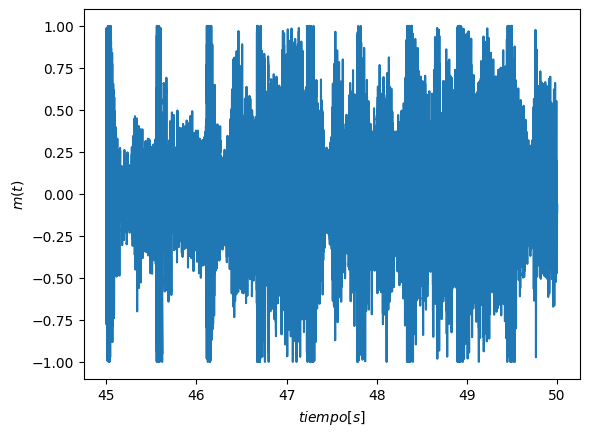

In [55]:
#Señal mensaje en tiempo y frecuencia
tt = np.arange(ti,tf,1/fs) # vector de tiempo
plt.plot(tt,m) #graficar señal mensaje en el tiempo
plt.xlabel('$tiempo [s]$')
plt.ylabel('$m(t)$')
plt.show()

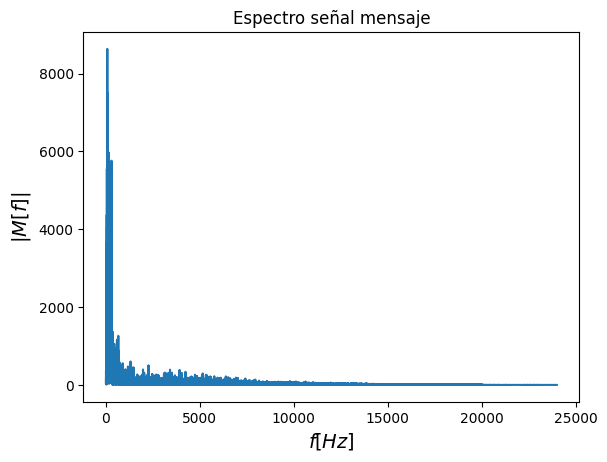

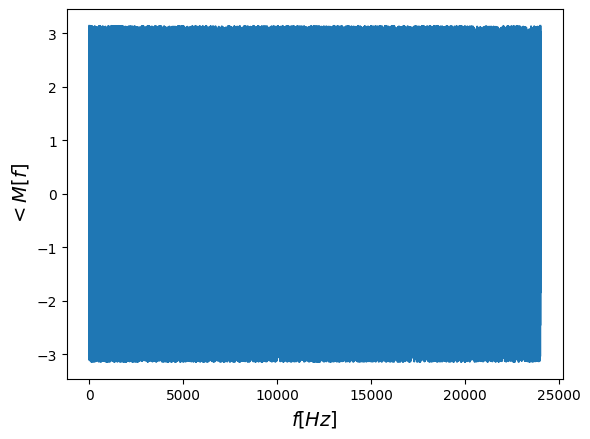

In [56]:
#Fourier señal mensaje
Mw = np.fft.rfft(m) # axis=0 permite aplicar fft por cada columna de xpro
vf = np.fft.rfftfreq(m.shape[0],1/fs) #se crea el vector de frecuencias
plt.plot(vf,abs(Mw))#se grafica la magnitud
plt.title(r'Espectro señal mensaje')
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$|M[f]|$',fontsize = 14)
plt.show()

plt.plot(vf, np.angle(Mw))#fase del espectro
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$<M[f]$',fontsize = 14)
plt.show()

Se fija una $F_o >> F_{max},$ para nuestro caso:

$$\boxed{F_o = 12000 [Hz]}$$

In [57]:
Fo = 12000 #frecuencia portadora
c = np.cos(2*np.pi*Fo*tt) #portadora

In [58]:
#repoducir portadora
Audio(c,rate=fs)

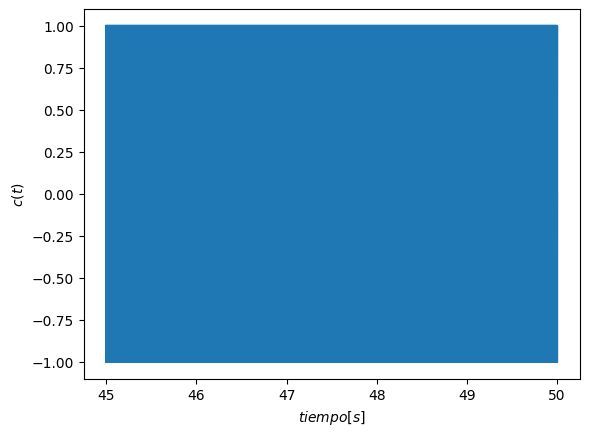

In [59]:
#Señal portadora en tiempo y frecuencia
plt.plot(tt,c) #graficar señal mensaje en el tiempo
plt.xlabel('$tiempo [s]$')
plt.ylabel('$c(t)$')
plt.show()

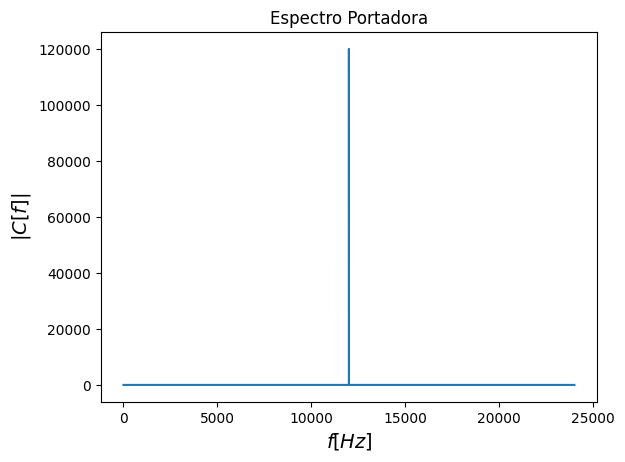

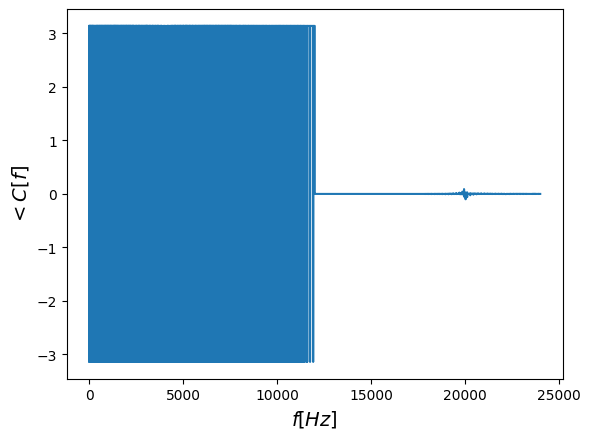

In [60]:
#Fourier señal portadora
Cw = np.fft.rfft(c) # axis=0 permite aplicar fft por cada columna de xpro
plt.plot(vf,abs(Cw))#se grafica la magnitud
plt.title(r'Espectro Portadora')
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$|C[f]|$',fontsize = 14)
plt.show()


plt.plot(vf, np.angle(Cw))#fase del espectro
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$<C[f]$',fontsize = 14)
plt.show()

In [61]:
#señal modulada
A1 = 2
y = A1*m*c #señal modulada en AM

In [62]:
#repoducir modulada
Audio(y,rate=fs)

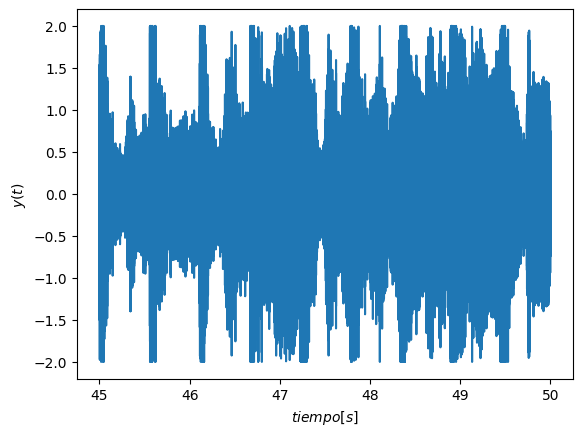

In [63]:
plt.plot(tt,y) #graficar señal modulada en el tiempo
plt.xlabel('$tiempo [s]$')
plt.ylabel('$y(t)$')
plt.show()

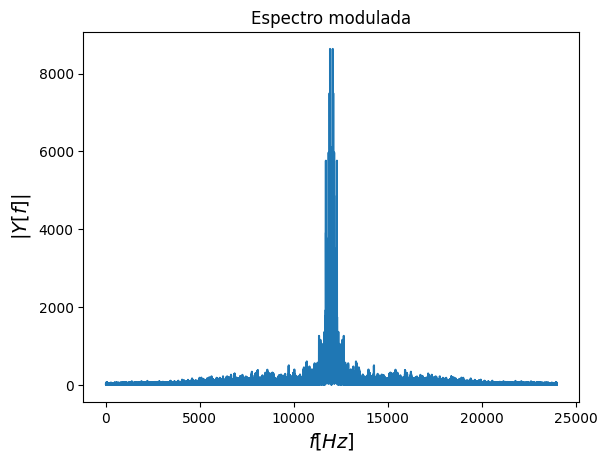

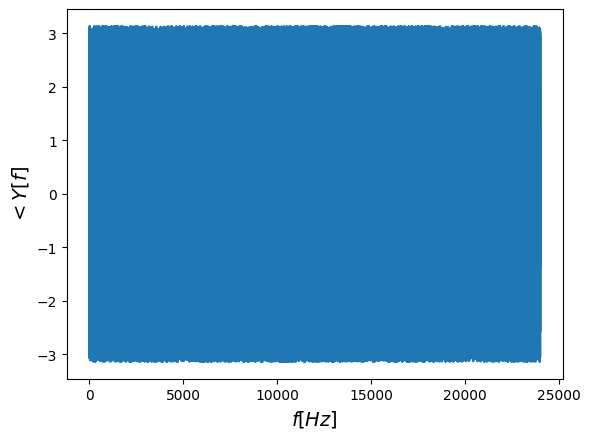

In [64]:
#Fourier señal modulada
Yw = np.fft.rfft(y) # axis=0 permite aplicar fft por cada columna de xpro
plt.plot(vf,abs(Yw))#se grafica la magnitud
plt.title(r'Espectro modulada')
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$|Y[f]|$',fontsize = 14)
plt.show()


plt.plot(vf, np.angle(Yw))#fase del espectro
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$<Y[f]$',fontsize = 14)
plt.show()

**Se demula la señal.**

#**Etapa 1: Mixer**

In [65]:
d = y*c #señal demodulada
#repoducir señal demodulada
Audio(d,rate=fs)

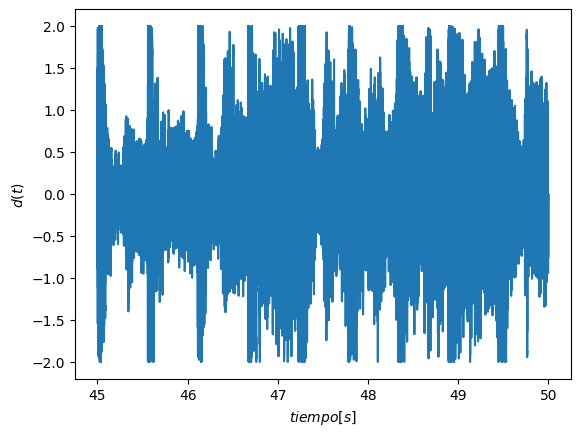

In [66]:
plt.plot(tt,d) #graficar señal demodulada en tiempo
plt.xlabel('$tiempo [s]$')
plt.ylabel('$d(t)$')
plt.show()

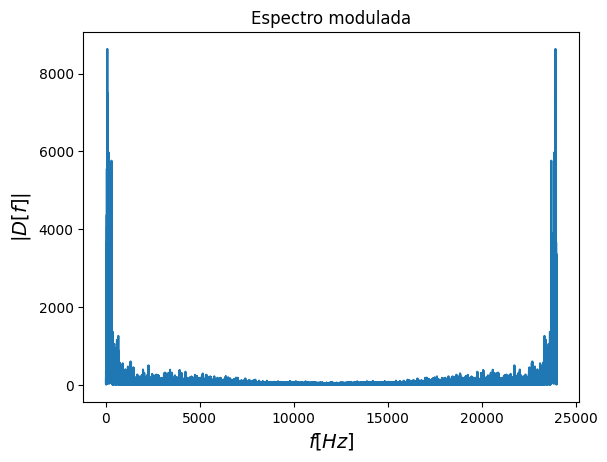

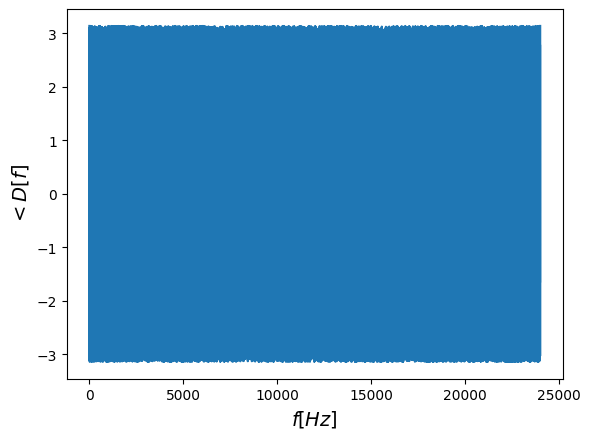

In [67]:
#Fourier señal demodulada
Dw = np.fft.rfft(d) # axis=0 permite aplicar fft por cada columna de xpro
plt.plot(vf,abs(Dw))#se grafica la magnitud
plt.title(r'Espectro modulada')
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$|D[f]|$',fontsize = 14)
plt.show()


plt.plot(vf, np.angle(Dw))#fase del espectro
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$<D[f]$',fontsize = 14)
plt.show()

#**Etapa 2: Filtro Pasabajas**

In [68]:
from scipy.signal import butter, cheby1, cheby2, bessel, lfilter, freqz, freqz_zpk, filtfilt
import matplotlib.pyplot as plt
import numpy as np

#**Diseño filtro Butteworth**

In [69]:
N = 10 #orden el filtro
Wn = 15000 #banda pasante
filt = 'lowpass' #tipo del filtro (pasa-baja, pasa-alta, pasabanda, rechazabanda)
out = 'zpk' #la funcion retorna los polos y ceros junto con la ganancia. Para usar numerador y denominador usar 'ba' junto con freqz
zeros, poles, gain = butter(N, Wn, btype=filt, output=out, fs=fs)
w, h = freqz_zpk(zeros, poles, gain, fs=fs) #Para indicar la longitud usar worN=K

In [70]:
from matplotlib.patches import Circle
#gráfica polos y ceros
def plot_freq_response(filter_name, w, h, N): #Mostrar la respuesta en frecuencia del filtro
  fig = plt.figure()
  ax1 = fig.add_subplot(1, 1, 1)
  ax1.set_title(filter_name +' Digital filter frequency response, order= ' + str(N))
  ax1.plot(w, 20 * np.log10(abs(h)), 'b')
  ax1.set_ylabel('Amplitude [dB]', color='b')
  ax1.set_xlabel('Frequency [Hz]')
  ax1.grid()
  ax2 = ax1.twinx()
  angles = np.unwrap(np.angle(h))
  ax2.plot(w, angles, 'g')
  ax2.set_ylabel('Angle [radians]', color='g')
  plt.axis('tight')
  plt.show()

def show_zp(z, p, title= 'Z-plane'): # Mostrar la ubicación de los polos y los zeros
  ax = plt.gca()

  ax.plot(np.real(z), np.imag(z), 'bo', fillstyle='none', ms = 10)
  ax.plot(np.real(p), np.imag(p), 'rx', fillstyle='none', ms = 10)
  unit_circle = Circle((0,0), radius=1, fill=False,
                        color='black', ls='solid', alpha=0.9)
  ax.add_patch(unit_circle)
  ax.axvline(0, color='0.7')
  ax.axhline(0, color='0.7')

  plt.title(title)
  plt.xlabel(r'Re{$z$}')
  plt.ylabel(r'Im{$z$}')
  plt.axis('equal')
  plt.xlim((-2, 2))
  plt.ylim((-2, 2))
  plt.grid()

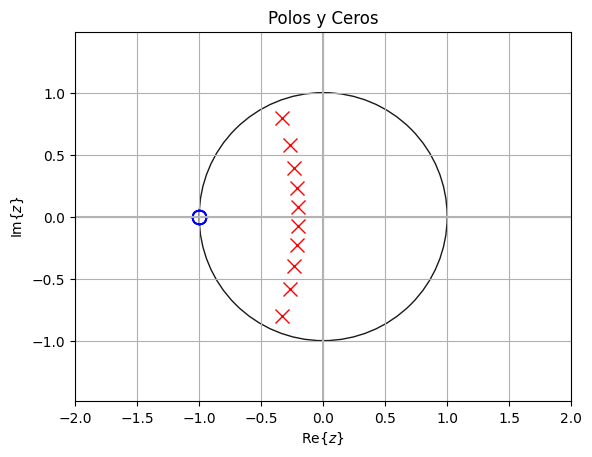

In [71]:
show_zp(zeros, poles, title='Polos y Ceros')#gráfica polos y ceros

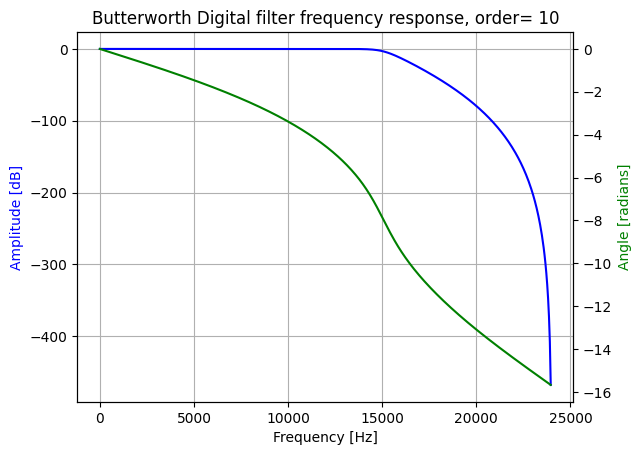

In [72]:
plot_freq_response('Butterworth', w, h, N) #gráfica de bode del filtro

#**Aplicacion filtro butterworth a la canción**

In [73]:
out='ba'
num, den = butter(N, Wn, btype=filt, output=out, fs=fs)
xf = lfilter(num, den, d, axis=0)
Audio(xf,rate=fs) #Audio con ruido filtrado

#**Etapa 3: Escalamiento de amplitud**

In [74]:
me = (2/A1)*xf #señal reescalada
Audio(me,rate=fs) #Audio con ruido filtrado

* Se grafica la señal rescatada en el dominio del teimpo y la frecuencia

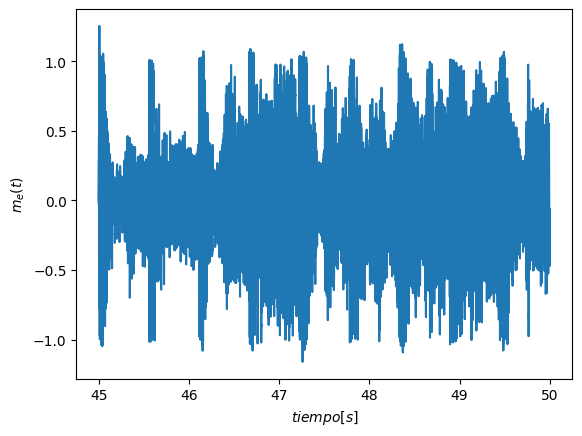

In [75]:
plt.plot(tt,me) #graficar señal recuperada
plt.xlabel('$tiempo [s]$')
plt.ylabel('$m_e(t)$')
plt.show()

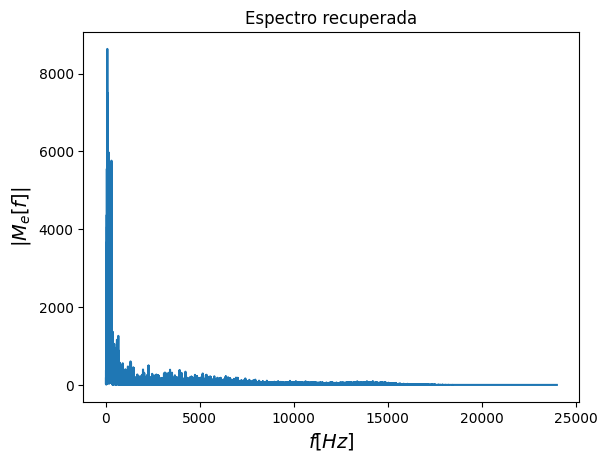

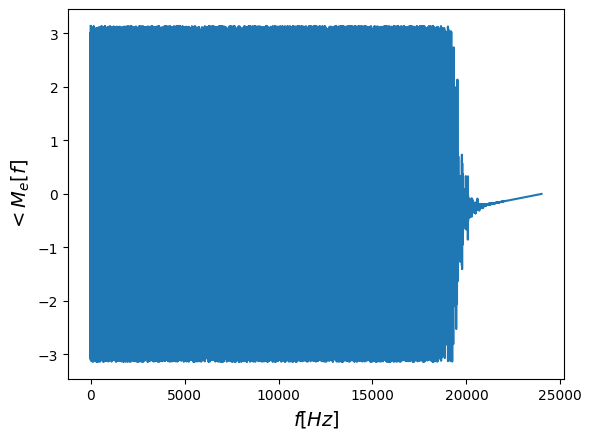

In [76]:
#Fourier señal recuperada
Mew = np.fft.rfft(me) # axis=0 permite aplicar fft por cada columna de xpro
plt.plot(vf,abs(Mew))#se grafica la magnitud
plt.title(r'Espectro recuperada')
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$|M_e[f]|$',fontsize = 14)
plt.show()


plt.plot(vf, np.angle(Mew))#fase del espectro
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$<M_e[f]$',fontsize = 14)
plt.show()

#**Diseño filtro Bessel**

In [77]:
N = 4
out = 'ba'
filt = 'lowpass' #tipo del filtro (pasa-baja, pasa-alta, pasabanda, rechazabanda)
normalization = 'mag' #Ajusta la frecuencia crítica según la respuesta que se desea
num, den = bessel(N, Wn=Wn, btype=filt, norm=normalization, output=out, fs=fs) #regresa numerador y denominador. Si se quiere obtener los polos y ceros usar scipy.signal.tf2zpk
w, h = freqz(num, den, fs=fs)

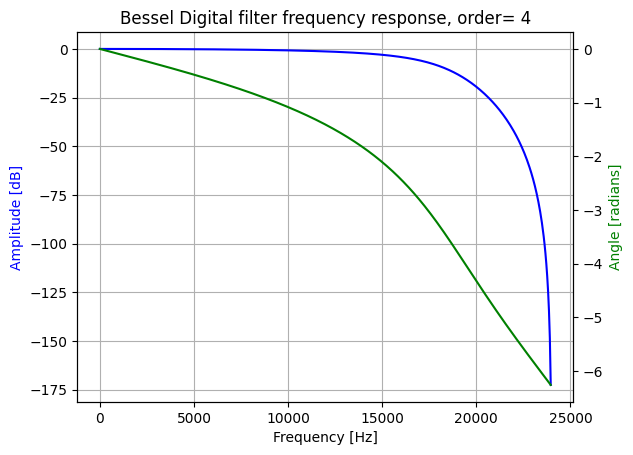

In [78]:
plot_freq_response('Bessel', w, h, N)

#**Aplicacion filtro bessel a la canción**

In [79]:
xf = lfilter(num, den, d, axis=0)
Audio(xf,rate=fs) #Audio con ruido filtrado

#**Etapa 3: Escalamiento de amplitud**

In [80]:
me = (2/A1)*xf #señal reescalada
Audio(me,rate=fs) #Audio con ruido filtrado

* Ahora, se grafica la señal rescatada en el dominio del tiempo y de la frecuencia

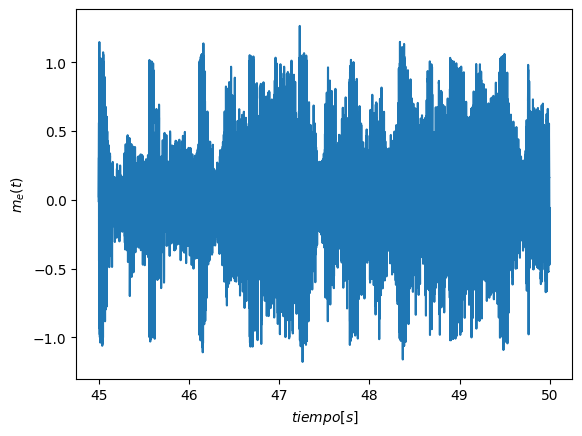

In [81]:
plt.plot(tt,me) #graficar señal recuperada
plt.xlabel('$tiempo [s]$')
plt.ylabel('$m_e(t)$')
plt.show()

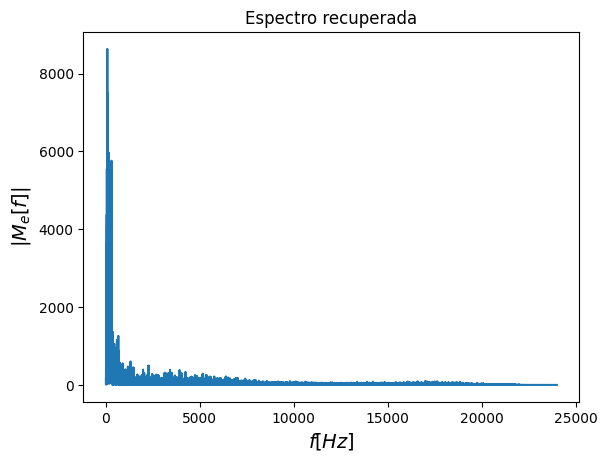

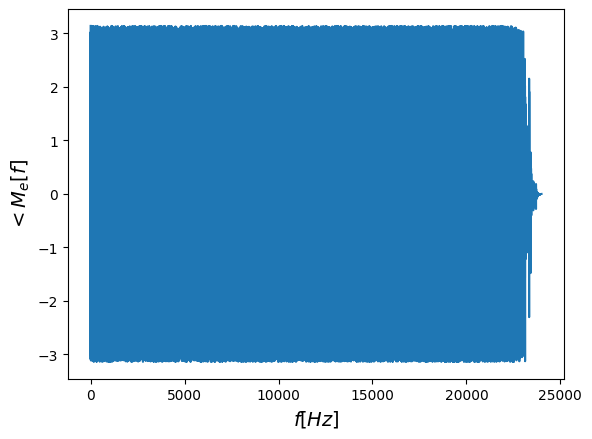

In [82]:
#Fourier señal recuperada
Mew = np.fft.rfft(me) # axis=0 permite aplicar fft por cada columna de xpro
plt.plot(vf,abs(Mew))#se grafica la magnitud
plt.title(r'Espectro recuperada')
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$|M_e[f]|$',fontsize = 14)
plt.show()


plt.plot(vf, np.angle(Mew))#fase del espectro
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$<M_e[f]$',fontsize = 14)
plt.show()

#**Diseño filtro Chebyshev1**

In [83]:
N = 4
ripple = 10
out='zpk'
zeros, poles, gain = cheby1(N, rp=ripple, Wn=Wn, btype=filt, output=out, fs=fs)
w, h = freqz_zpk(zeros, poles, gain, fs=fs)

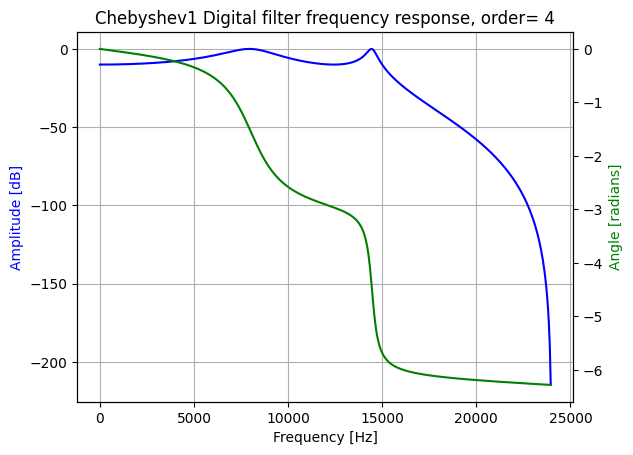

In [84]:
plot_freq_response('Chebyshev1', w, h, N)

#**Diseño filtro Chebyshev1**

In [85]:
N = 4
ripple = 10
out='zpk'
zeros, poles, gain = cheby1(N, rp=ripple, Wn=Wn, btype=filt, output=out, fs=fs)
w, h = freqz_zpk(zeros, poles, gain, fs=fs)

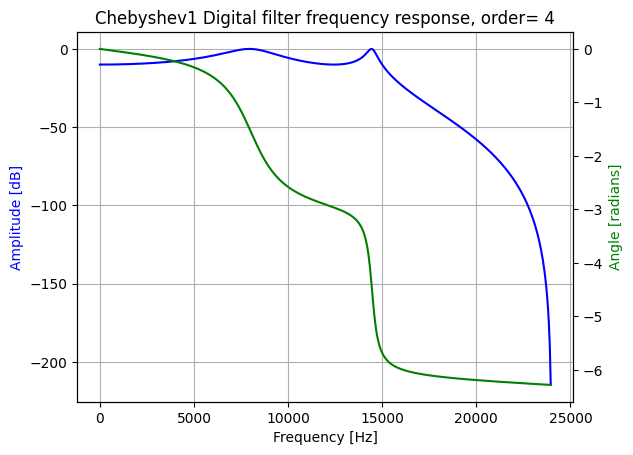

In [86]:
plot_freq_response('Chebyshev1', w, h, N)

#**Aplicacion filtro chebyshev1 a la canción**

In [87]:
out='ba'
num, de= cheby1(N, rp=ripple, Wn=Wn, btype=filt, output=out, fs=fs)
xf = lfilter(num, den, d, axis=0)
Audio(xf,rate=fs) #Audio con ruido filtrado

#**Etapa 3: Escalamiento de amplitud**

In [88]:
me = (2/A1)*xf #señal reescalada
Audio(me,rate=fs) #Audio con ruido filtrado


*   Ahora, se grafica la señal recuperada en el dominio del tiempo y de la frecuencia




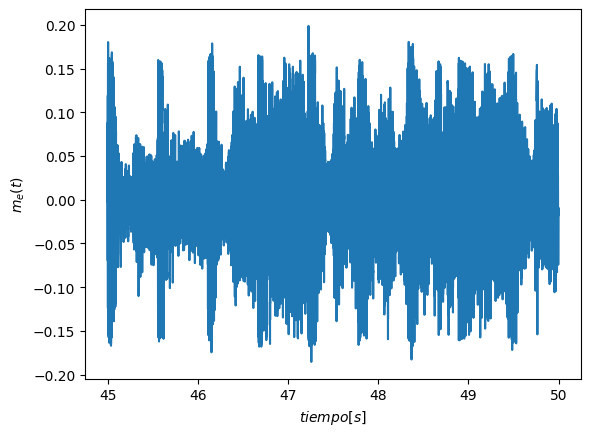

In [89]:
plt.plot(tt,me) #graficar señal recuperada
plt.xlabel('$tiempo [s]$')
plt.ylabel('$m_e(t)$')
plt.show()

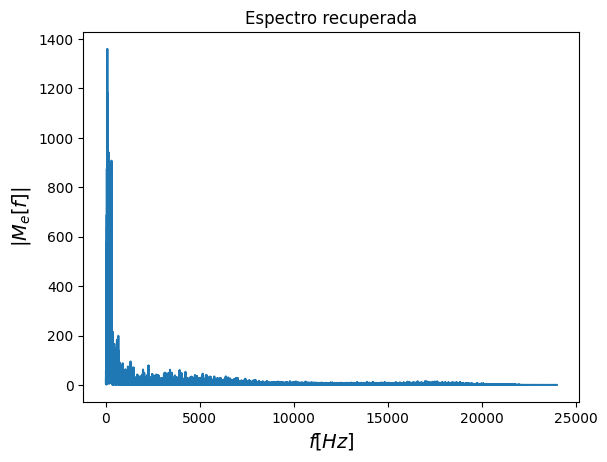

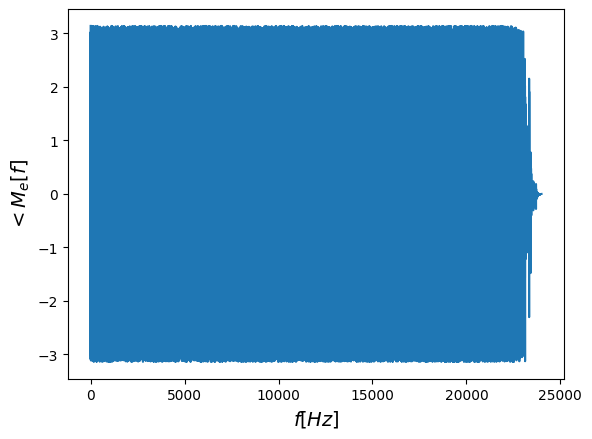

In [90]:
#Fourier señal recuperada
Mew = np.fft.rfft(me) # axis=0 permite aplicar fft por cada columna de xpro
plt.plot(vf,abs(Mew))#se grafica la magnitud
plt.title(r'Espectro recuperada')
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$|M_e[f]|$',fontsize = 14)
plt.show()


plt.plot(vf, np.angle(Mew))#fase del espectro
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$<M_e[f]$',fontsize = 14)
plt.show()

#**Diseño filtro Chebyshev2**

In [91]:
N = 4
ripple = 20
out = 'ba' #no regresa los polos y ceros, sino la funcion de transferencia
num, den = cheby2(N, rs=ripple, Wn=Wn, btype=filt, output=out, fs=fs) #regresa numerador y denominador. Si se quiere obtener los polos y ceros usar scipy.signal.tf2zpk
w, h = freqz(num, den, fs=fs)

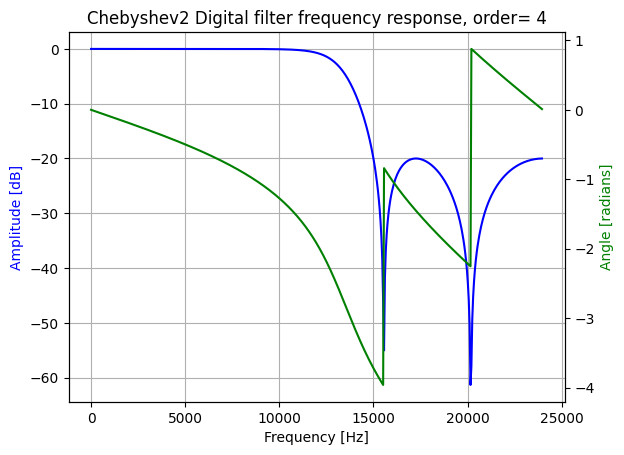

In [92]:
plot_freq_response('Chebyshev2', w, h, N)

#**Aplicacion filtro chebyshev2 a la canción**


In [93]:
xf = lfilter(num, den, d, axis=0)
Audio(xf,rate=fs) #Audio con ruido filtrado

#**Etapa 3: Escalamiento de amplitud**

In [94]:
me = (2/A1)*xf #señal reescalada
Audio(me,rate=fs) #Audio con ruido filtrado


*   Ahora, se grafica la señal recuperada en el dominio del tiempo y la frecuencia



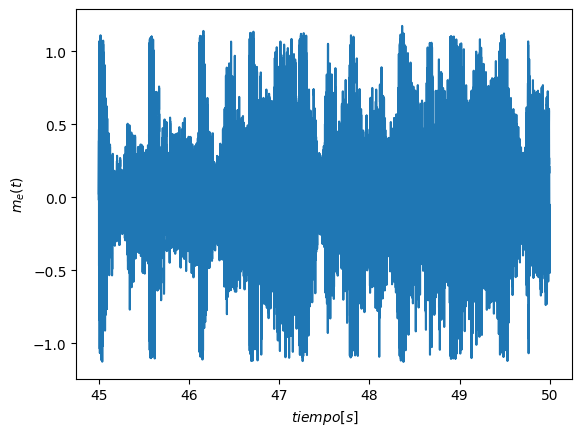

In [95]:
plt.plot(tt,me) #graficar señal recuperada
plt.xlabel('$tiempo [s]$')
plt.ylabel('$m_e(t)$')
plt.show()

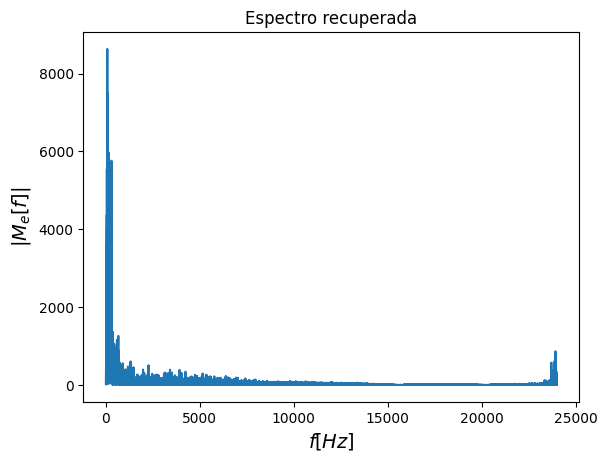

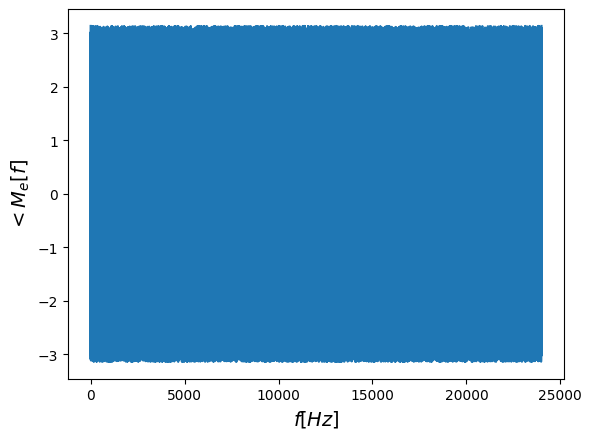

In [96]:
#Fourier señal recuperada
Mew = np.fft.rfft(me) # axis=0 permite aplicar fft por cada columna de xpro
plt.plot(vf,abs(Mew))#se grafica la magnitud
plt.title(r'Espectro recuperada')
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$|M_e[f]|$',fontsize = 14)
plt.show()


plt.plot(vf, np.angle(Mew))#fase del espectro
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$<M_e[f]$',fontsize = 14)
plt.show()